# Imports 

In [30]:
# ---- Core
import warnings, json, argparse, random
from pathlib import Path

warnings.filterwarnings("ignore")

# ---- Numerics / Data
import numpy as np
import pandas as pd

# ---- Plotting (default settings only)
import matplotlib.pyplot as plt
import seaborn as sns

# ---- Stats / Signal
import statsmodels.api as sm
from scipy.stats import skew, kurtosis, randint

try:
    from scipy.optimize import curve_fit
    SCIPY_CURVE_OK = True
except Exception:
    SCIPY_CURVE_OK = False

try:
    from scipy.signal import savgol_filter
    SCIPY_SG_OK = True
except Exception:
    SCIPY_SG_OK = False

# ---- sklearn (modeling + eval)
from sklearn.model_selection import (
    train_test_split, cross_validate, GridSearchCV,
    RandomizedSearchCV, GroupKFold
)

from sklearn.preprocessing import (
    StandardScaler, RobustScaler, MinMaxScaler, Normalizer,
    LabelEncoder, PolynomialFeatures, normalize, scale
)

from sklearn.pipeline import Pipeline
from sklearn.feature_selection import VarianceThreshold

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_curve, mean_absolute_error,
    mean_squared_error, r2_score, silhouette_score
)

from sklearn.linear_model import LogisticRegression, SGDClassifier, LinearRegression, Ridge
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.inspection import permutation_importance

# ---- sklearn (unsupervised + DR)
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# ---- UMAP
import umap
from umap import UMAP

# ---- XGBoost
from xgboost import XGBClassifier, XGBRegressor

# ---- Imbalanced learning / missingness
from imblearn.over_sampling import SMOTE
import missingno as msno

# ---- TPOT (optional / heavy)
from tpot import TPOTClassifier

# ---- TensorFlow / Keras
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    Dense, Dropout, LSTM, Bidirectional, RepeatVector,
    TimeDistributed, Conv1D, MaxPooling1D,
    Flatten, ConvLSTM2D
)
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import optimizers

# ---- Reproducibility
RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
random.seed(RANDOM_STATE)
tf.random.set_seed(RANDOM_STATE)

# ---- Pandas Display
pd.options.display.max_rows = 100
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 1000)

# Feature Definitions for System Condition Monitoring 
### 1: Cooler condition(%) : (Fan duty cycle of C1, Cooling Power decrease)
3: close to total failure  
20: reduced efficiency  
100: full efficiency  
    
### 2: Valve condition(%) : (Switchable bypass orifices V9, Switching degradation)  
100: optimal switching behavior  
90: small lag  
80: severe lag  
73: close to total failure   
  
### 3: Internal pump leakage : (Control current of V10)  
0: no leakage  
1: weak leakage  
2: severe leakage  
  
### 4: Hydraulic accumulator(bar) : (A1-4 with different pre-charge pressures, gas leakage)  
130: optimal pressure  
115: slightly reduced pressure  
100: severely reduced pressure  
90: close to total failure  
  
### 5: stable flag:
0: conditions were stable  
1: static conditions might not have been reached yet  

# Loading Data and Creating Label Dataframe

In [31]:
BASE_PATH = Path(r"C:\Users\sreek\Downloads\venture\archive")

ce   = np.genfromtxt(BASE_PATH / "CE.txt")
cp   = np.genfromtxt(BASE_PATH / "CP.txt")
eps1 = np.genfromtxt(BASE_PATH / "EPS1.txt")
se   = np.genfromtxt(BASE_PATH / "SE.txt")
vs1  = np.genfromtxt(BASE_PATH / "VS1.txt")

target = np.genfromtxt(BASE_PATH / "profile.txt")

# Build df_target from profile.txt
label_cols = [
    "Cooler_Condition",
    "Valve_Condition",
    "Internal_Pump_Leakage",
    "Hydraulic_Accumulator",
    "Stable_Flag",
]

target = np.asarray(target)

# profile.txt can be shape (N,5) or flattened; normalize it to (N,5)
if target.ndim == 1:
    if target.size % 5 != 0:
        raise ValueError(f"profile.txt has {target.size} values; not divisible by 5. Check file format.")
    target = target.reshape(-1, 5)

if target.shape[1] != 5:
    raise ValueError(f"Expected profile.txt with 5 columns, got shape {target.shape}")

df_target = pd.DataFrame(target, columns=label_cols)

print("df_target shape:", df_target.shape)
display(df_target.head())


fs1 = np.genfromtxt(BASE_PATH / "FS1.txt")
fs2 = np.genfromtxt(BASE_PATH / "FS2.txt")

ps1 = np.genfromtxt(BASE_PATH / "PS1.txt")
ps2 = np.genfromtxt(BASE_PATH / "PS2.txt")
ps3 = np.genfromtxt(BASE_PATH / "PS3.txt")
ps4 = np.genfromtxt(BASE_PATH / "PS4.txt")
ps5 = np.genfromtxt(BASE_PATH / "PS5.txt")
ps6 = np.genfromtxt(BASE_PATH / "PS6.txt")

ts1 = np.genfromtxt(BASE_PATH / "TS1.txt")
ts2 = np.genfromtxt(BASE_PATH / "TS2.txt")
ts3 = np.genfromtxt(BASE_PATH / "TS3.txt")
ts4 = np.genfromtxt(BASE_PATH / "TS4.txt")

df_target shape: (2205, 5)


,Cooler_Condition,Valve_Condition,Internal_Pump_Leakage,Hydraulic_Accumulator,Stable_Flag
0,3.0,100.0,0.0,130.0,1.0
1,3.0,100.0,0.0,130.0,1.0
2,3.0,100.0,0.0,130.0,1.0
3,3.0,100.0,0.0,130.0,1.0
4,3.0,100.0,0.0,130.0,1.0


# Creating Artificial Product_Category with Realistic Domain Shift

# EDA

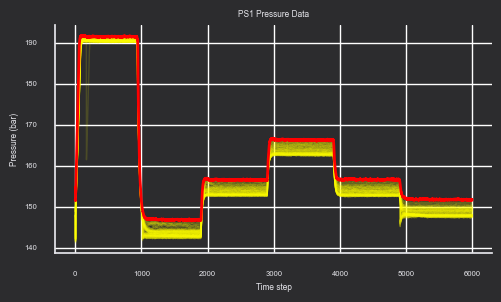

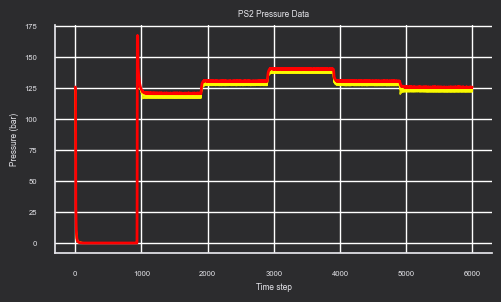

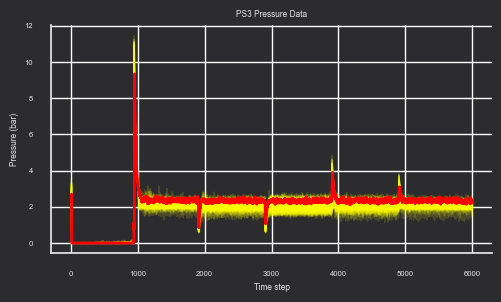

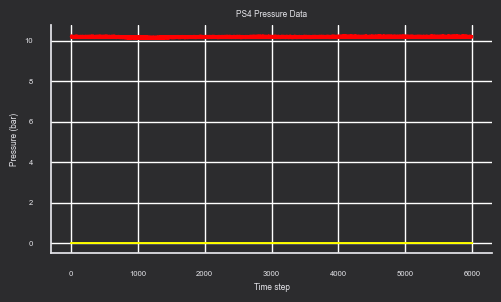

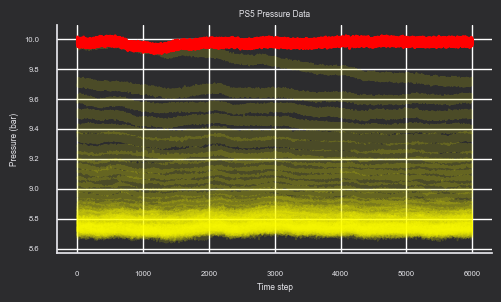

...

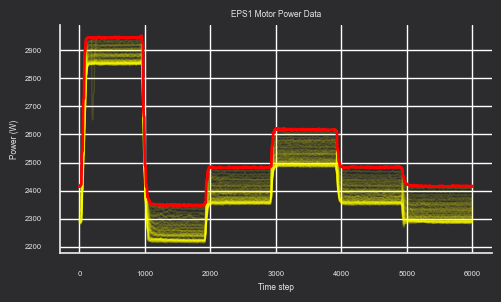

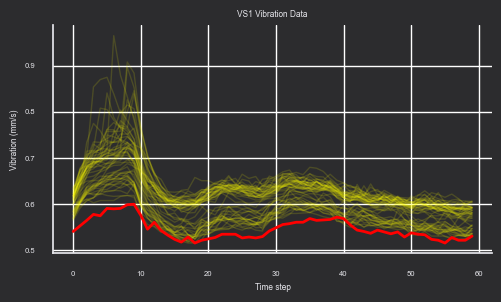

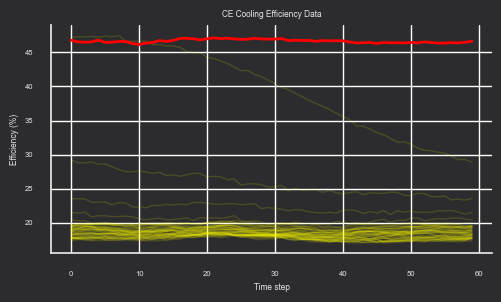

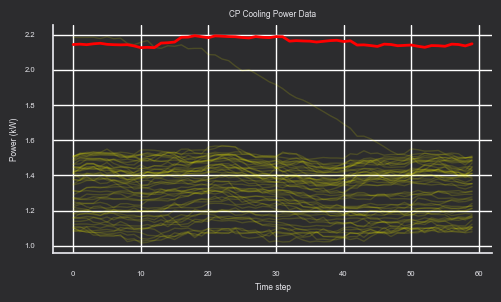

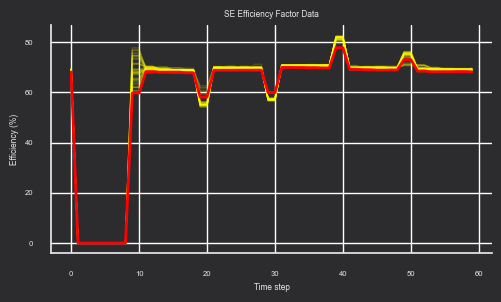

In [32]:
def plot_sensor_overlay(sensor_data, sensor_name, ylabel, max_cycles=50, highlight_idx=-1):
    """
    Overlays multiple cycles of a sensor signal and highlights one cycle.
    """
    fig, ax = plt.subplots(figsize=(5, 3), dpi=100)

    n = min(max_cycles, sensor_data.shape[0] - 1)
    for i in range(n):
        ax.plot(sensor_data[i], color='yellow', linewidth=1, alpha=0.15)

    ax.plot(sensor_data[highlight_idx], color='red', linewidth=2)

    ax.set_title(f'{sensor_name} Data')
    ax.set_xlabel('Time step')
    ax.set_ylabel(ylabel)

    plt.tight_layout()
    plt.show()

plot_sensor_overlay(ps1, 'PS1 Pressure', 'Pressure (bar)')
plot_sensor_overlay(ps2, 'PS2 Pressure', 'Pressure (bar)')
plot_sensor_overlay(ps3, 'PS3 Pressure', 'Pressure (bar)')
plot_sensor_overlay(ps4, 'PS4 Pressure', 'Pressure (bar)')
plot_sensor_overlay(ps5, 'PS5 Pressure', 'Pressure (bar)')
plot_sensor_overlay(ps6, 'PS6 Pressure', 'Pressure (bar)')
plot_sensor_overlay(fs1, 'FS1 Flow', 'Flow (L/min)')
plot_sensor_overlay(fs2, 'FS2 Flow', 'Flow (L/min)')
plot_sensor_overlay(ts1, 'TS1 Temperature', 'Temperature (°C)')
plot_sensor_overlay(ts2, 'TS2 Temperature', 'Temperature (°C)')
plot_sensor_overlay(ts3, 'TS3 Temperature', 'Temperature (°C)')
plot_sensor_overlay(ts4, 'TS4 Temperature', 'Temperature (°C)')
plot_sensor_overlay(eps1, 'EPS1 Motor Power', 'Power (W)')
plot_sensor_overlay(vs1, 'VS1 Vibration', 'Vibration (mm/s)')
plot_sensor_overlay(ce, 'CE Cooling Efficiency', 'Efficiency (%)')
plot_sensor_overlay(cp, 'CP Cooling Power', 'Power (kW)')
plot_sensor_overlay(se, 'SE Efficiency Factor', 'Efficiency (%)')

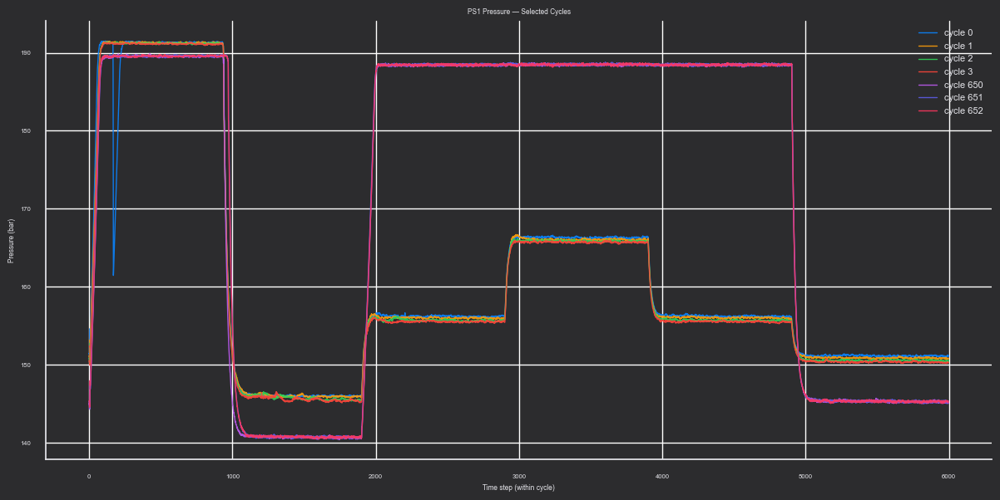

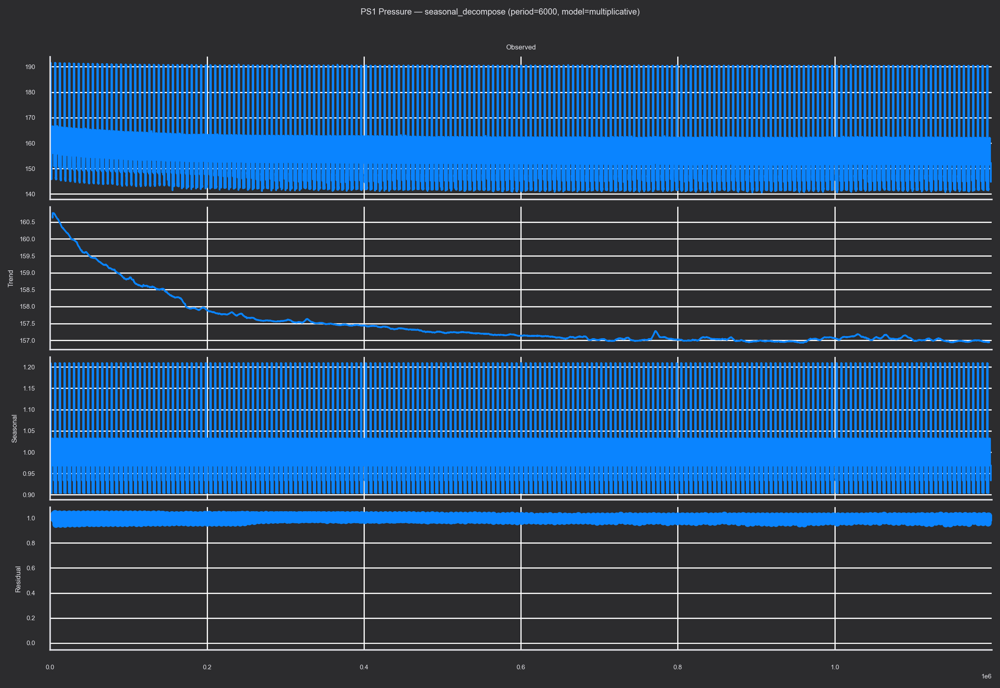

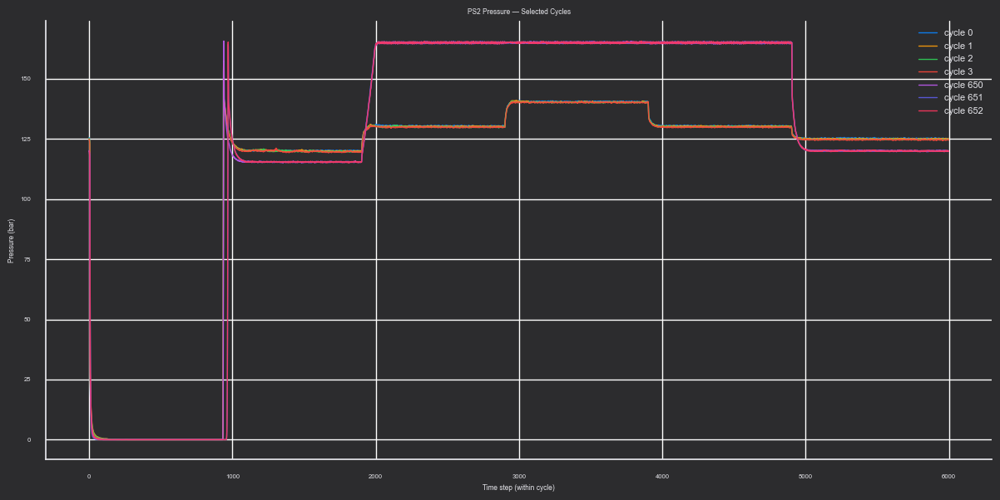

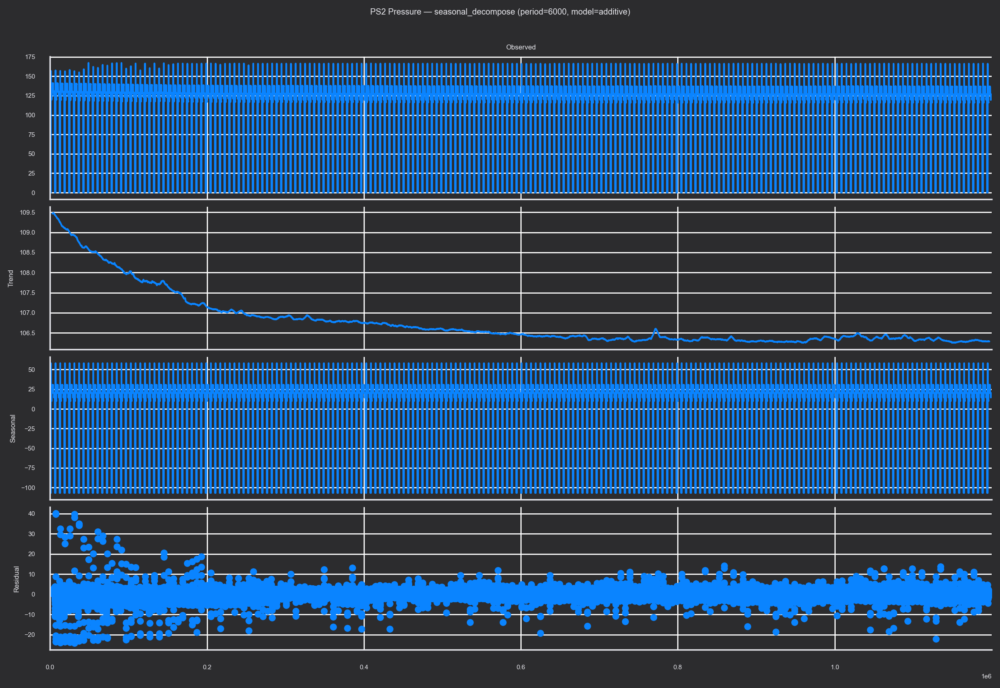

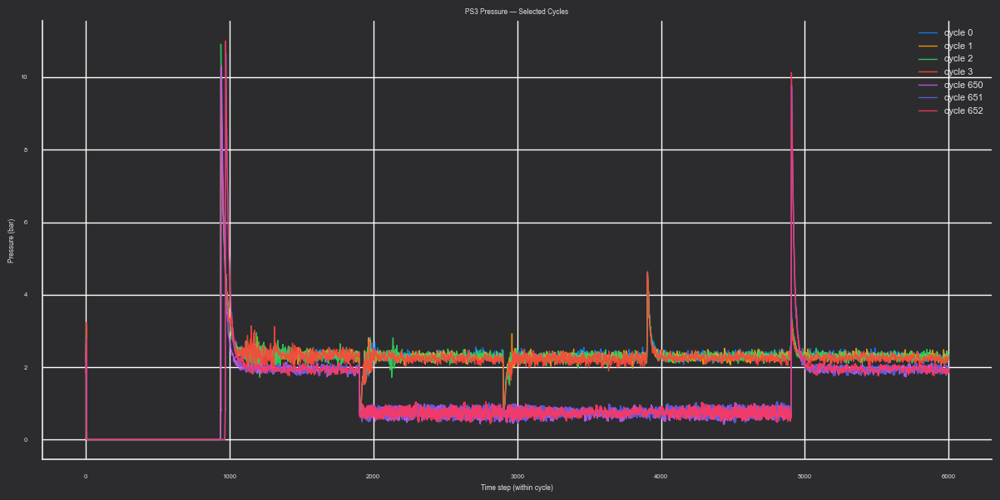

...

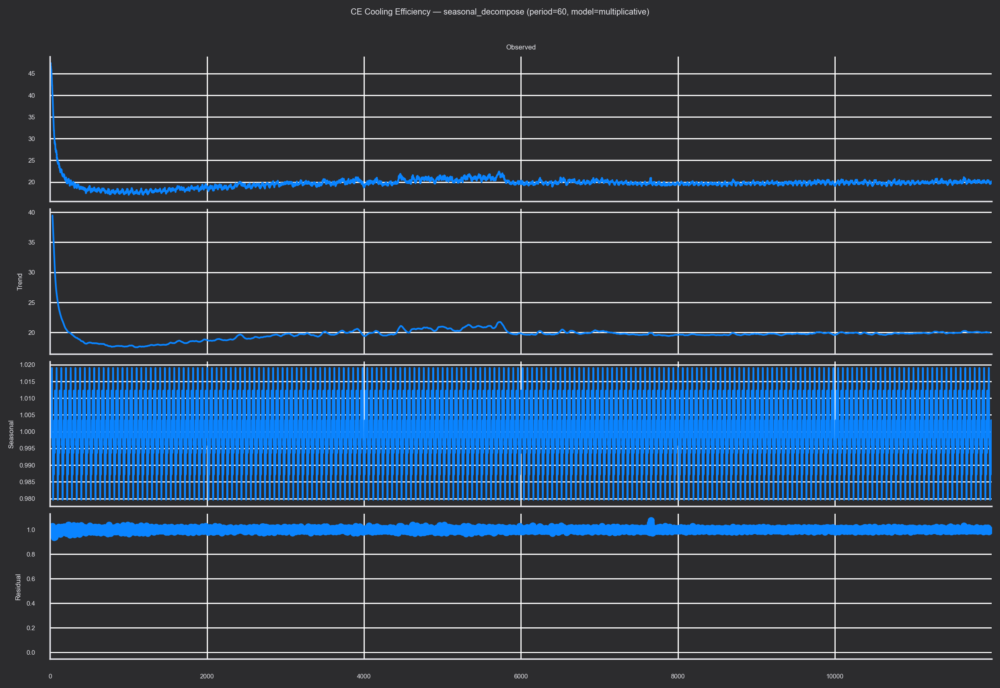

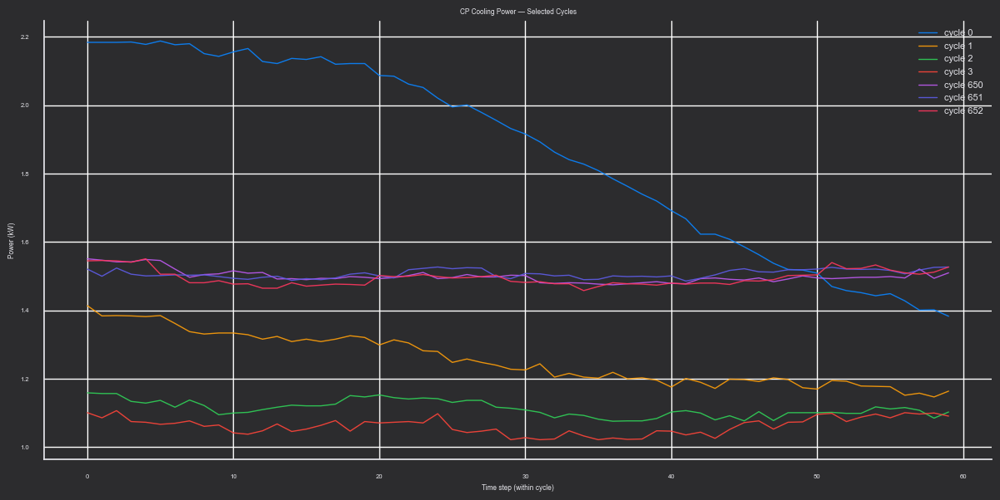

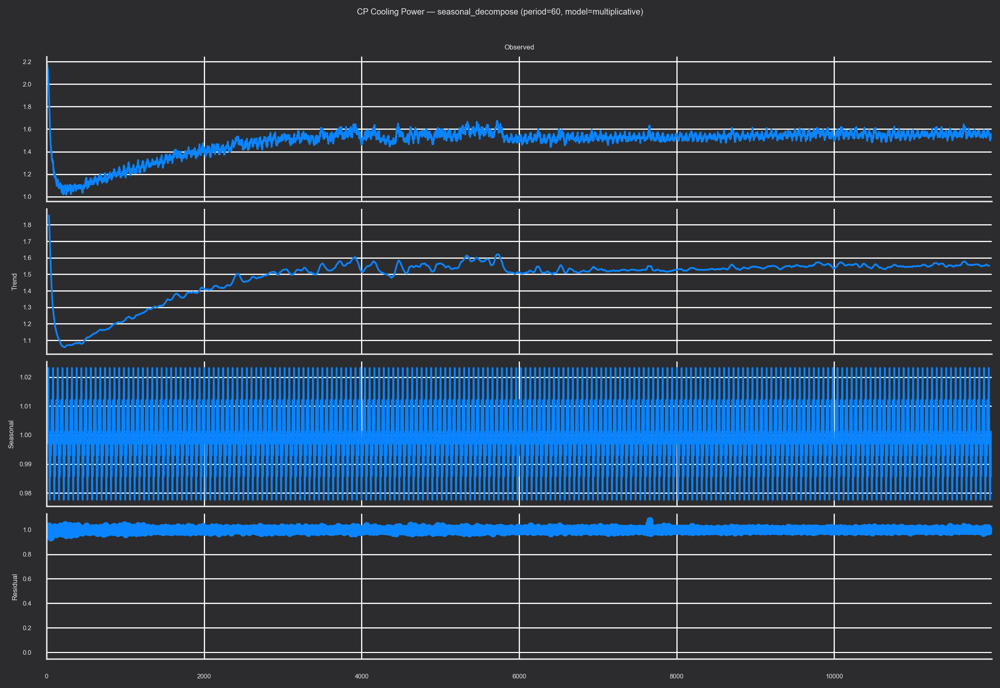

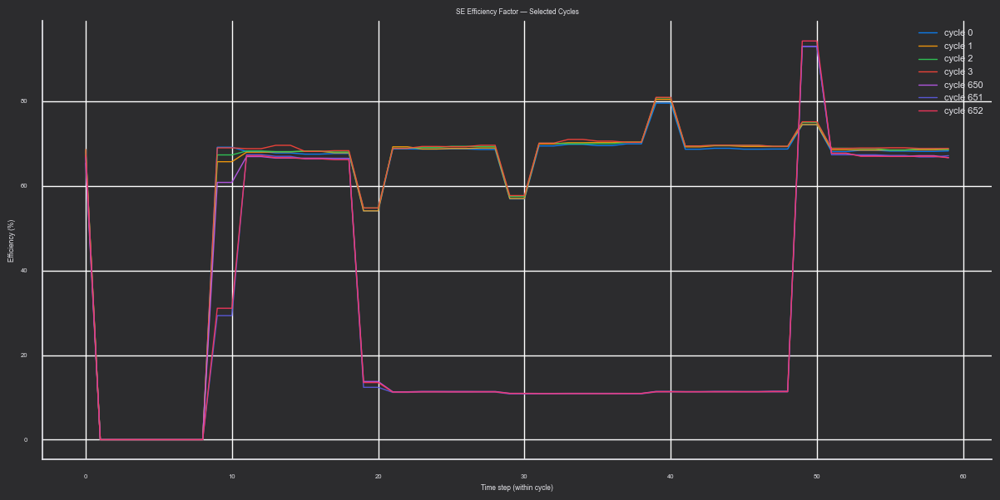

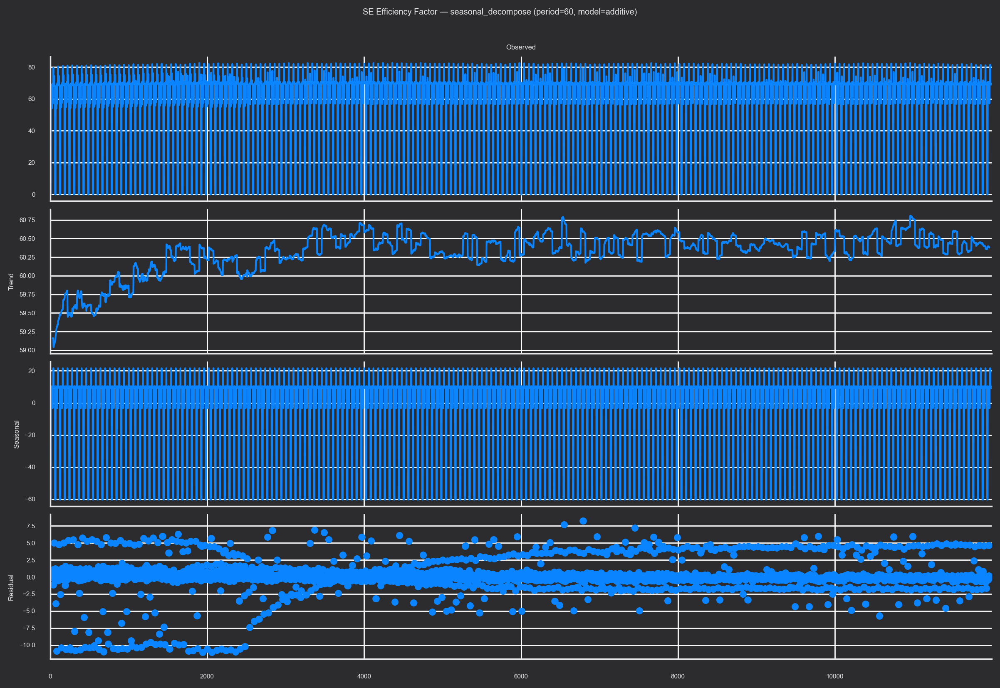

In [33]:
# 1) Helpers
def plot_cycles(sensor_data, name, ylabel="", cycle_indices=None, figsize=(12, 6), dpi=100):
    """
    Plot selected cycles from a 2D sensor array: shape (n_cycles, n_steps_per_cycle).
    """
    if cycle_indices is None:
        cycle_indices = [0, 1, 2, 3]
    cycle_indices = [i for i in cycle_indices if 0 <= i < sensor_data.shape[0]]

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    for idx in cycle_indices:
        ax.plot(sensor_data[idx], linewidth=1, alpha=0.9, label=f"cycle {idx}")

    ax.set_title(f"{name} — Selected Cycles")
    ax.set_xlabel("Time step (within cycle)")
    if ylabel:
        ax.set_ylabel(ylabel)
    ax.legend(loc="best", fontsize=8)
    plt.tight_layout()
    plt.show()


def make_continuous(sensor_data, n_cycles=200):
    """
    Concatenate multiple cycles end-to-end to form a 1D 'continuous' time series.
    """
    n = min(n_cycles, sensor_data.shape[0])
    return sensor_data[:n].reshape(-1)


def decompose_continuous(sensor_data, name, period, model="multiplicative", n_cycles=200, figsize=(12, 8)):
    """
    Seasonal decomposition on a continuous series created by concatenating cycles.
    """
    x = make_continuous(sensor_data, n_cycles=n_cycles)

    # seasonal_decompose prefers strictly positive for multiplicative
    if model == "multiplicative":
        if np.any(x <= 0):
            # fallback to additive if zeros/negatives exist
            model = "additive"

    res = sm.tsa.seasonal_decompose(x, period=period, model=model)
    fig = res.plot()
    fig.set_size_inches(figsize[0], figsize[1])
    fig.suptitle(f"{name} — seasonal_decompose (period={period}, model={model})", y=1.02)
    plt.tight_layout()
    plt.show()


def analyze_sensor(sensor_data, name, ylabel, period, cycle_indices=None, n_cycles_for_decomp=200):
    """
    Full replication:
    1) cycle overlay plots
    2) decomposition on concatenated signal
    """
    plot_cycles(sensor_data, name, ylabel=ylabel, cycle_indices=cycle_indices)
    decompose_continuous(sensor_data, name, period=period, n_cycles=n_cycles_for_decomp)

# 2) Sensor registry (name, array, ylabel, period)
# period = "how many samples until a repeating pattern"
# Here we choose period = samples per cycle for each sensor (works well when concatenated cycle-by-cycle)
sensors = [
    ("PS1 Pressure", ps1, "Pressure (bar)", ps1.shape[1]),
    ("PS2 Pressure", ps2, "Pressure (bar)", ps2.shape[1]),
    ("PS3 Pressure", ps3, "Pressure (bar)", ps3.shape[1]),
    ("PS4 Pressure", ps4, "Pressure (bar)", ps4.shape[1]),
    ("PS5 Pressure", ps5, "Pressure (bar)", ps5.shape[1]),
    ("PS6 Pressure", ps6, "Pressure (bar)", ps6.shape[1]),

    ("EPS1 Motor Power", eps1, "Power (W)", eps1.shape[1]),

    ("FS1 Flow", fs1, "Flow (L/min)", fs1.shape[1]),
    ("FS2 Flow", fs2, "Flow (L/min)", fs2.shape[1]),

    ("TS1 Temperature", ts1, "Temperature (°C)", ts1.shape[1]),
    ("TS2 Temperature", ts2, "Temperature (°C)", ts2.shape[1]),
    ("TS3 Temperature", ts3, "Temperature (°C)", ts3.shape[1]),
    ("TS4 Temperature", ts4, "Temperature (°C)", ts4.shape[1]),

    ("VS1 Vibration", vs1, "Vibration (mm/s)", vs1.shape[1]),

    ("CE Cooling Efficiency", ce, "Efficiency (%)", ce.shape[1]),
    ("CP Cooling Power", cp, "Power (kW)", cp.shape[1]),
    ("SE Efficiency Factor", se, "Efficiency (%)", se.shape[1]),
]

# 3) Run for all sensors
# Example cycle indices: early cycles and a few later ones (if available)
for name, data, ylabel, period in sensors:
    # pick indices like [0,1,2,3] plus later ones if possible
    ci = [0, 1, 2, 3]
    if data.shape[0] > 700:
        ci += [650, 651, 652]
    analyze_sensor(
        sensor_data=data,
        name=name,
        ylabel=ylabel,
        period=period,
        cycle_indices=ci,
        n_cycles_for_decomp=200
    )

# Feature extractor
## - smoothing (ema or savgol)
## - ONE FFT per cycle
## - ~25-35 features per sensor per cycle
## - correlation heatmap only on TOP features 


Product category distribution:
Product_Category
Cat1    1546
Cat2     659
Name: count, dtype: int64
Feature matrix shape: (2205, 459)
Total columns (features + labels): 465


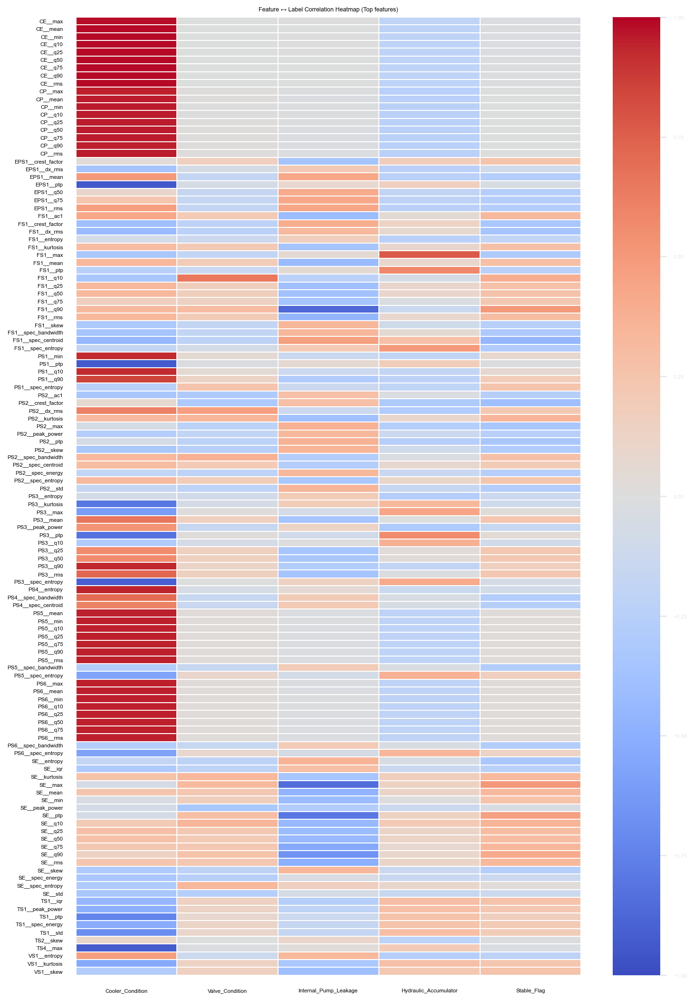

corr min/max: -0.938402399149408 0.992019279989237


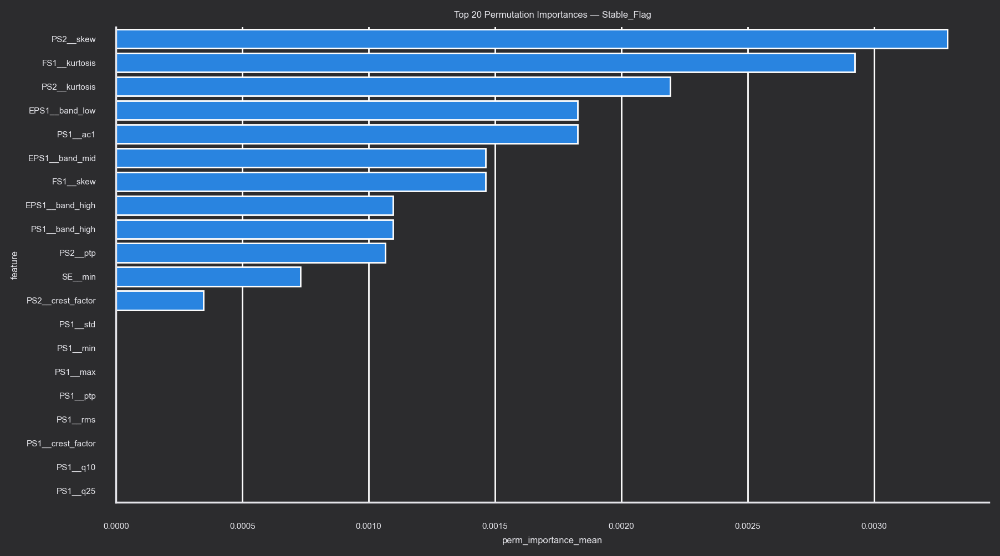

In [34]:
# 1) Utilities
def _safe_log(x, eps=1e-12):
    return np.log(np.clip(x, eps, None))

def shannon_entropy(x, bins=32):
    hist, _ = np.histogram(x, bins=bins, density=True)
    p = hist / (hist.sum() + 1e-12)
    return float(-(p * _safe_log(p)).sum())

def spectral_entropy(power_spectrum, eps=1e-12):
    p = power_spectrum / (power_spectrum.sum() + eps)
    return float(-(p * _safe_log(p, eps)).sum())

def smooth_signal(x, method="ema", ema_alpha=0.2, sg_window=11, sg_poly=2):
    x = np.asarray(x, dtype=float)
    if method == "none":
        return x
    if method == "ema":
        a = float(ema_alpha)
        y = np.empty_like(x)
        y[0] = x[0]
        for i in range(1, len(x)):
            y[i] = a * x[i] + (1 - a) * y[i-1]
        return y
    if method == "savgol":
        if not SCIPY_SG_OK:
            return smooth_signal(x, method="ema", ema_alpha=ema_alpha)
        w = int(sg_window)
        if w % 2 == 0:
            w += 1
        w = min(w, len(x) if len(x) % 2 == 1 else len(x) - 1)
        if w < 5:
            return x
        return savgol_filter(x, window_length=w, polyorder=int(sg_poly), mode="interp")
    raise ValueError("method must be one of: none, ema, savgol")


# 2) Compact time + FFT features (ONE FFT per cycle)
def time_features_compact(x):
    x = np.asarray(x, dtype=float)
    eps = 1e-12
    n = x.size

    mean = float(x.mean())
    std  = float(x.std(ddof=0))
    mn   = float(x.min())
    mx   = float(x.max())
    ptp  = float(mx - mn)

    absx = np.abs(x)
    rms = float(np.sqrt((x**2).mean()))
    crest = float((absx.max() + eps) / (rms + eps))

    q10, q25, q50, q75, q90 = np.quantile(x, [0.10, 0.25, 0.50, 0.75, 0.90])
    iqr = float(q75 - q25)

    dx = np.diff(x)
    dx_rms = float(np.sqrt((dx**2).mean())) if dx.size else 0.0

    # lag-1 autocorr
    x0 = x - mean
    denom = float((x0**2).sum() + eps)
    ac1 = float((x0[:-1] * x0[1:]).sum() / denom) if n > 1 else 0.0

    sk = float(skew(x)) if (SCIPY_OK and std > eps) else 0.0
    ku = float(kurtosis(x, fisher=True)) if (SCIPY_OK and std > eps) else 0.0

    return {
        "mean": mean,
        "std": std,
        "min": mn,
        "max": mx,
        "ptp": ptp,
        "rms": rms,
        "crest_factor": crest,
        "q10": float(q10),
        "q25": float(q25),
        "q50": float(q50),
        "q75": float(q75),
        "q90": float(q90),
        "iqr": iqr,
        "dx_rms": dx_rms,
        "ac1": ac1,
        "entropy": shannon_entropy(x, bins=32),
        "skew": sk,
        "kurtosis": ku,
    }

def fft_features_compact(x, fs):
    x = np.asarray(x, dtype=float)
    n = x.size
    x0 = x - x.mean()

    spec = np.fft.rfft(x0)
    mag = np.abs(spec)
    power = mag**2
    freqs = np.fft.rfftfreq(n, d=1.0/fs)

    if power.sum() <= 1e-12:
        return {
            "spec_energy": 0.0,
            "spec_entropy": 0.0,
            "spec_centroid": 0.0,
            "spec_bandwidth": 0.0,
            "peak_freq": 0.0,
            "peak_power": 0.0,
            "band_low": 0.0,
            "band_mid": 0.0,
            "band_high": 0.0,
        }

    # spectral energy + entropy
    energy = float(power.sum())
    sent = spectral_entropy(power)

    # centroid + bandwidth
    centroid = float((freqs * power).sum() / power.sum())
    bandwidth = float(np.sqrt(((freqs - centroid) ** 2 * power).sum() / power.sum()))

    # peak freq/power (ignore DC bin 0)
    start = 1 if len(power) > 1 else 0
    peak_i = int(np.argmax(power[start:]) + start)
    peak_freq = float(freqs[peak_i])
    peak_power = float(power[peak_i])

    # simple band powers (relative)
    fmax = freqs.max() if freqs.size else 1.0
    b1 = freqs <= (0.33 * fmax)
    b2 = (freqs > (0.33 * fmax)) & (freqs <= (0.66 * fmax))
    b3 = freqs > (0.66 * fmax)

    p1 = float(power[b1].sum() / (energy + 1e-12))
    p2 = float(power[b2].sum() / (energy + 1e-12))
    p3 = float(power[b3].sum() / (energy + 1e-12))

    return {
        "spec_energy": energy,
        "spec_entropy": sent,
        "spec_centroid": centroid,
        "spec_bandwidth": bandwidth,
        "peak_freq": peak_freq,
        "peak_power": peak_power,
        "band_low": p1,
        "band_mid": p2,
        "band_high": p3,
    }

def extract_cycle_features_fast(x, fs, smooth_method="ema", use_fft=True):
    x = smooth_signal(x, method=smooth_method)
    feats = {}
    feats.update(time_features_compact(x))
    if use_fft:
        feats.update(fft_features_compact(x, fs))
    return feats

def featurize_sensor_2d_fast(sensor_2d, sensor_name, fs, smooth_method="ema", use_fft=True):
    sensor_2d = np.asarray(sensor_2d)
    rows = []
    for i in range(sensor_2d.shape[0]):
        f = extract_cycle_features_fast(sensor_2d[i], fs=fs, smooth_method=smooth_method, use_fft=use_fft)
        rows.append({f"{sensor_name}__{k}": v for k, v in f.items()})
    return pd.DataFrame(rows)


# 3) Build features across all sensors (FAST)
sensor_registry = [
    ("PS1", ps1, 100),
    ("PS2", ps2, 100),
    ("PS3", ps3, 100),
    ("PS4", ps4, 100),
    ("PS5", ps5, 100),
    ("PS6", ps6, 100),
    ("EPS1", eps1, 100),
    ("FS1", fs1, 10),
    ("FS2", fs2, 10),
    ("TS1", ts1, 1),
    ("TS2", ts2, 1),
    ("TS3", ts3, 1),
    ("TS4", ts4, 1),
    ("VS1", vs1, 1),
    ("CE", ce, 1),
    ("CP", cp, 1),
    ("SE", se, 1),
]

feature_blocks = []
for name, arr, fs in sensor_registry:
    feature_blocks.append(featurize_sensor_2d_fast(arr, name, fs, smooth_method="ema", use_fft=True))

X_features = pd.concat(feature_blocks, axis=1)

# Join labels (df_target must exist)
label_cols = ['Cooler_Condition','Valve_Condition','Internal_Pump_Leakage','Hydraulic_Accumulator','Stable_Flag']
df_final = pd.concat([X_features, df_target.reset_index(drop=True)], axis=1)

# FAKE DOMAIN CATEGORIES for DOMAIN ADAPTATION DEMO

np.random.seed(42)

CATEGORY_COL = "Product_Category"
CAT1, CAT2 = "Cat1", "Cat2"

n = len(df_final)

# 70 / 30 split so both domains are large enough
df_final[CATEGORY_COL] = np.where(np.random.rand(n) < 0.70, CAT1, CAT2)

# Inject a mild domain shift into Cat2
feat_cols = (
    df_final
    .select_dtypes(include=[np.number])
    .columns
    .difference(label_cols)
)

# shift only a subset of features (realistic domain drift)
shift_cols = np.random.choice(feat_cols, size=min(40, len(feat_cols)), replace=False)

cat2_mask = df_final[CATEGORY_COL] == CAT2

df_final.loc[cat2_mask, shift_cols] = (
    df_final.loc[cat2_mask, shift_cols] * 1.10
    + 0.05 * df_final.loc[cat2_mask, shift_cols].std()
)

print("\nProduct category distribution:")
print(df_final[CATEGORY_COL].value_counts())


print("Feature matrix shape:", X_features.shape)
print("Total columns (features + labels):", df_final.shape[1])


# 4) Correlation heatmap (TOP features only)
df_num = df_final.select_dtypes(include=[np.number]).replace([np.inf, -np.inf], np.nan).fillna(0.0)
corr_feat_label = df_num.corr()[label_cols].drop(label_cols, errors="ignore").fillna(0.0)

# take top features per label to force contrast + readability
TOP_PER_LABEL = 40
top_feats = set()
for lab in label_cols:
    s = corr_feat_label[lab].abs().sort_values(ascending=False).head(TOP_PER_LABEL)
    top_feats.update(s.index.tolist())

corr_plot = corr_feat_label.loc[sorted(list(top_feats))]

fig, ax = plt.subplots(figsize=(10, 14), dpi=150, facecolor="white")
ax.set_facecolor("white")
sns.heatmap(
    corr_plot,
    ax=ax,
    cmap="coolwarm",
    vmin=-1, vmax=1, center=0,
    linewidths=0.2,
    cbar=True
)
ax.set_title("Feature ↔ Label Correlation Heatmap (Top features)", color="black")
ax.tick_params(colors="black")
plt.tight_layout()
plt.show()

print("corr min/max:", float(corr_feat_label.min().min()), float(corr_feat_label.max().max()))


# 5) Feature importance
def feature_importance_for_target_fast(df, target_col, task="auto", top_k=20, random_state=42, n_repeats=5):
    y = df[target_col].copy()

    drop_cols = list(set(label_cols + [target_col]))
    X = df.drop(columns=drop_cols, errors="ignore")
    X = X.select_dtypes(include=[np.number]).replace([np.inf, -np.inf], np.nan).fillna(0.0)

    if task == "auto":
        unique_vals = np.unique(y)
        task = "clf" if (len(unique_vals) <= 10) else "reg"

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.25, random_state=random_state,
        stratify=y if task == "clf" else None
    )

    if task == "clf":
        model = RandomForestClassifier(
            n_estimators=200, random_state=random_state, n_jobs=-1,
            max_depth=None, min_samples_leaf=2
        )
        scoring = "f1_weighted"
    else:
        model = RandomForestRegressor(
            n_estimators=200, random_state=random_state, n_jobs=-1,
            max_depth=None, min_samples_leaf=2
        )
        scoring = "neg_mean_absolute_error"

    pipe = Pipeline([("model", model)])
    pipe.fit(X_train, y_train)

    imp = pipe.named_steps["model"].feature_importances_
    imp_df = pd.DataFrame({"feature": X.columns, "importance": imp}).sort_values("importance", ascending=False)

    perm = permutation_importance(
        pipe, X_test, y_test,
        n_repeats=n_repeats,
        random_state=random_state,
        scoring=scoring,
        n_jobs=-1
    )
    perm_df = pd.DataFrame({
        "feature": X.columns,
        "perm_importance_mean": perm.importances_mean,
        "perm_importance_std": perm.importances_std
    }).sort_values("perm_importance_mean", ascending=False)

    # plot only top_k
    plt.figure(figsize=(9, 5))
    sns.barplot(data=perm_df.head(top_k), x="perm_importance_mean", y="feature")
    plt.title(f"Top {top_k} Permutation Importances — {target_col}")
    plt.tight_layout()
    plt.show()

    return imp_df, perm_df

# Cast labels once
for col in label_cols:
    df_final[col] = df_final[col].astype(int)

# Run only 1-2 targets first (much faster). Uncomment more later.
imp_sf, perm_sf = feature_importance_for_target_fast(df_final, "Stable_Flag", task="clf", top_k=20, n_repeats=5)
# imp_cc, perm_cc = feature_importance_for_target_fast(df_final, "Cooler_Condition", task="clf", top_k=20, n_repeats=5)
# imp_vc, perm_vc = feature_importance_for_target_fast(df_final, "Valve_Condition", task="clf", top_k=20, n_repeats=5)
# imp_ipl, perm_ipl = feature_importance_for_target_fast(df_final, "Internal_Pump_Leakage", task="clf", top_k=20, n_repeats=5)
# imp_ha, perm_ha = feature_importance_for_target_fast(df_final, "Hydraulic_Accumulator", task="clf", top_k=20, n_repeats=5)

# Baseline Predictive Models + Curve Fitting
## - Linear Regression
## - Polynomial Regression
## - Curve fitting (simple single-feature baseline)
## - Compare with true labels (quality scores)

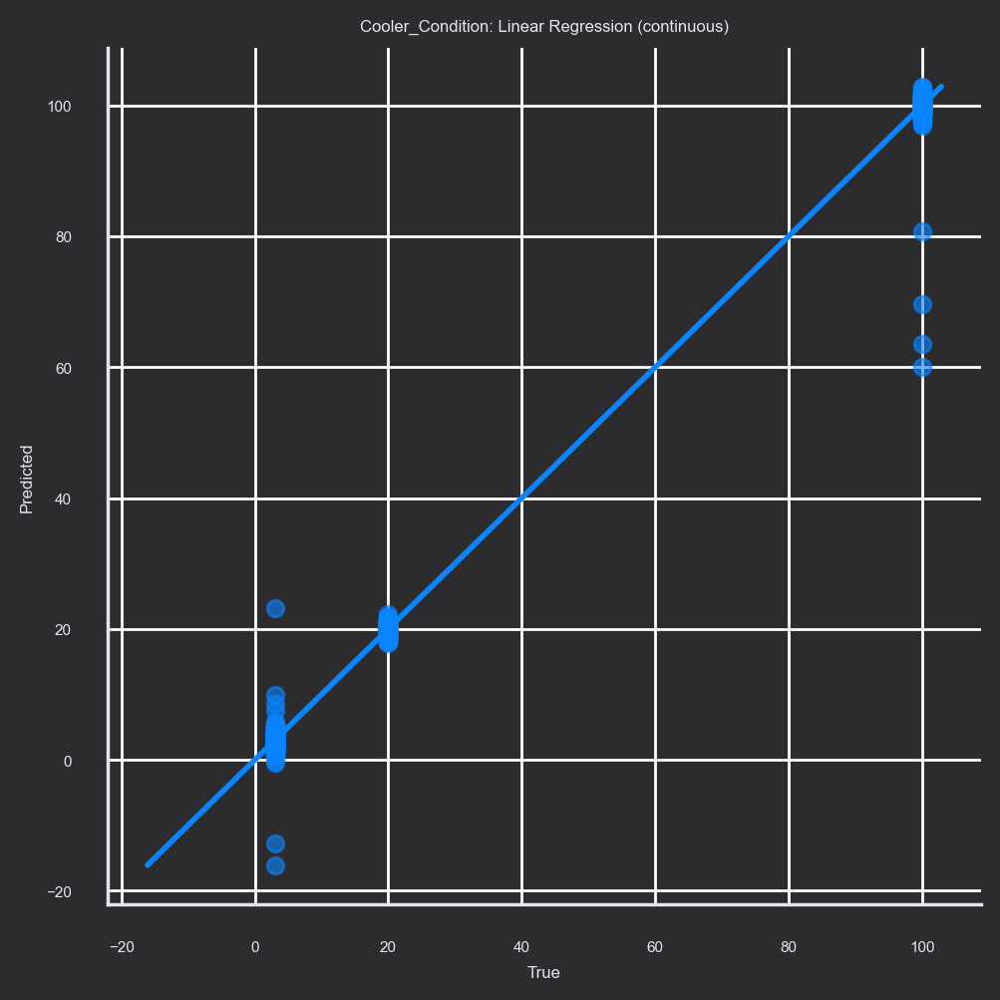

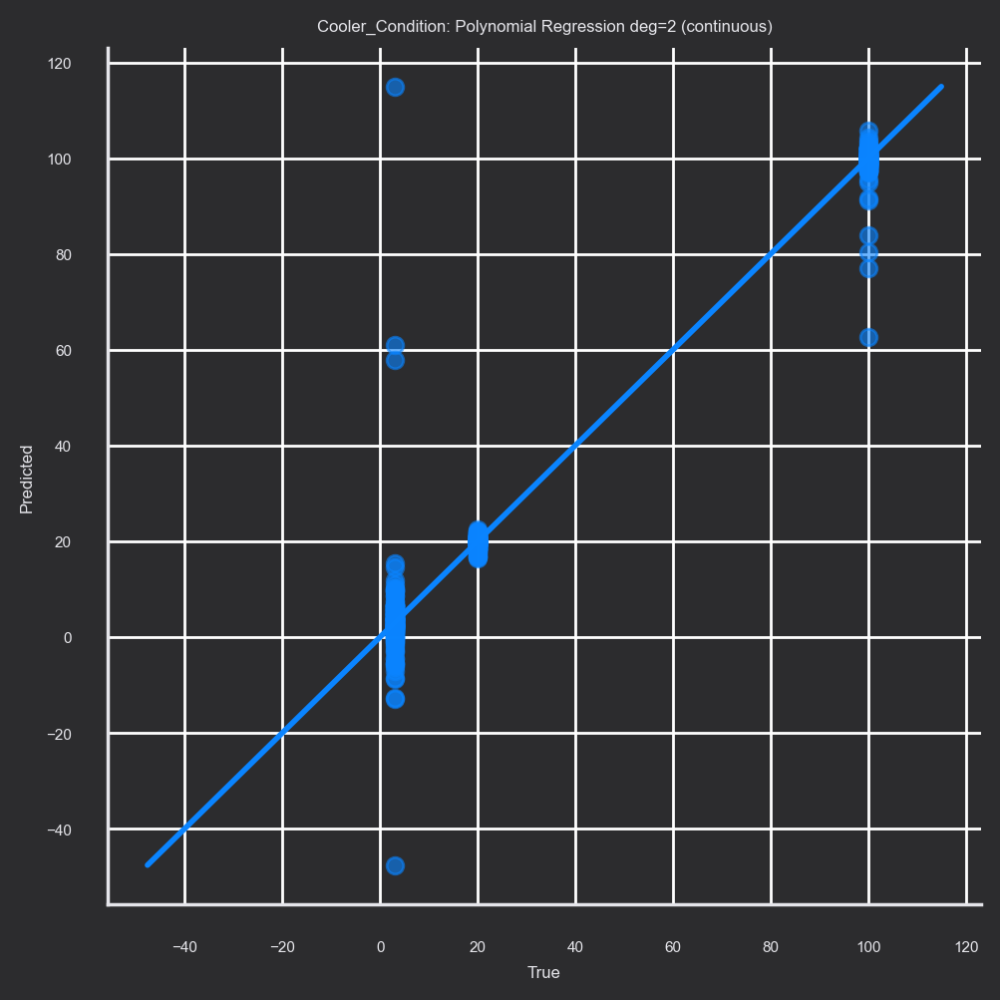

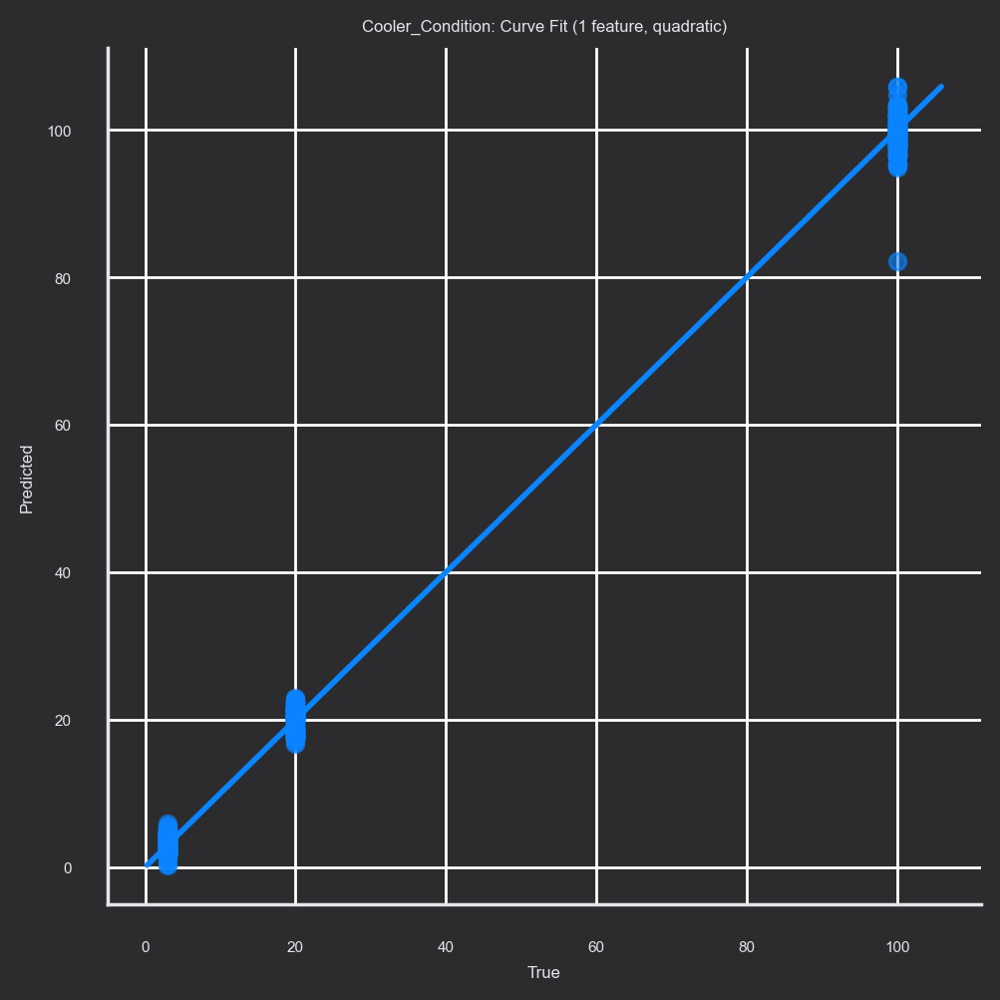

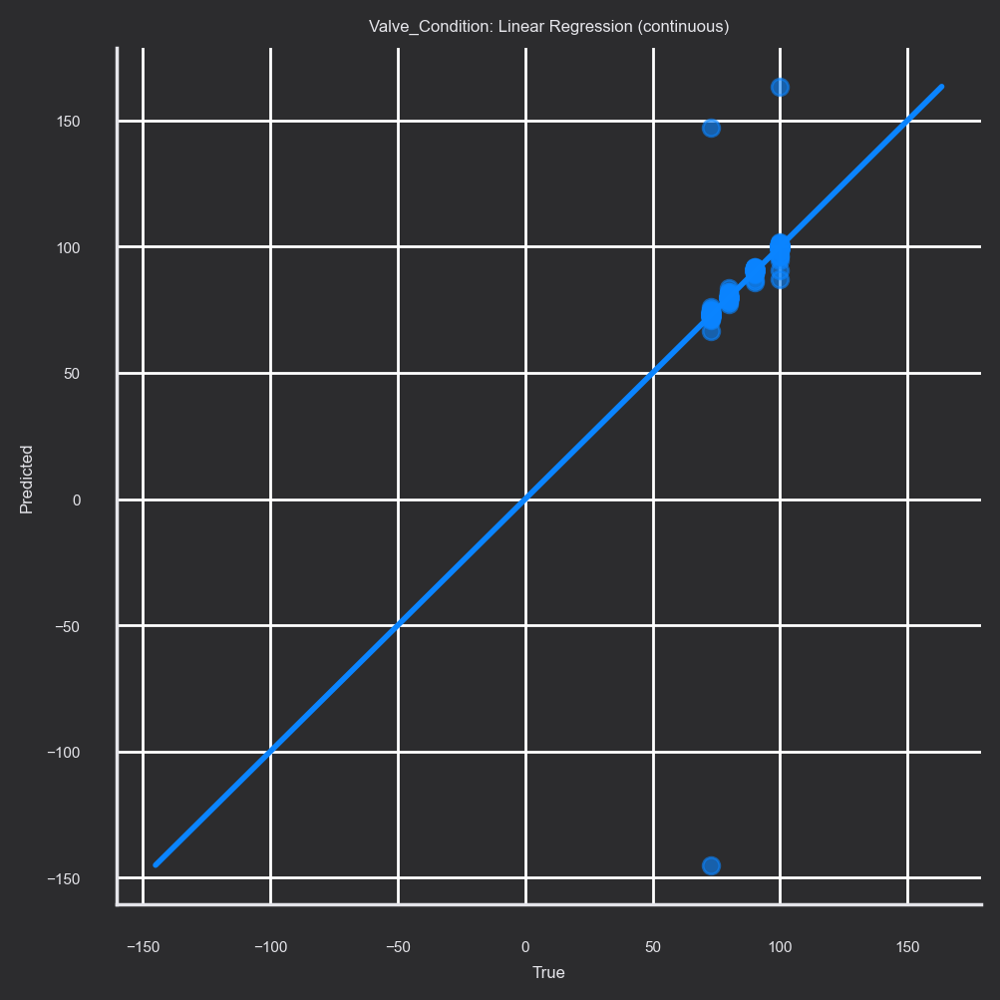

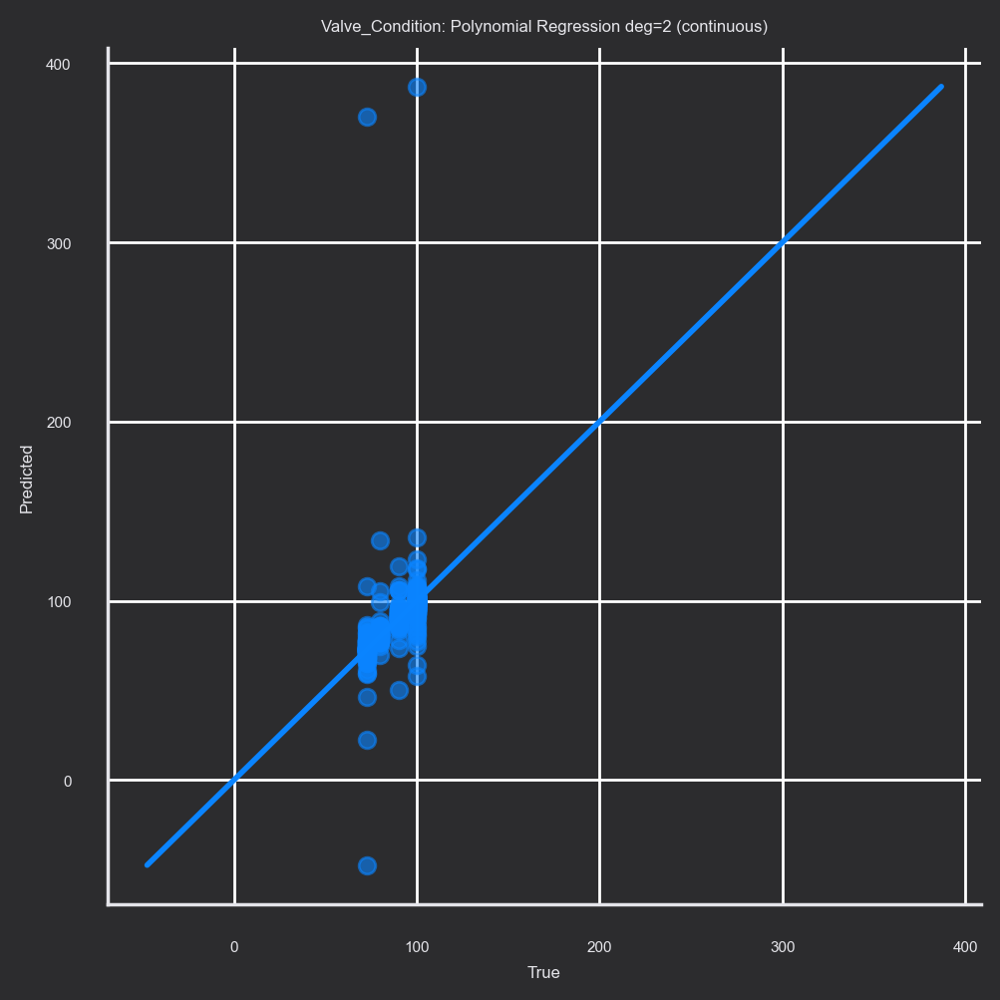

...

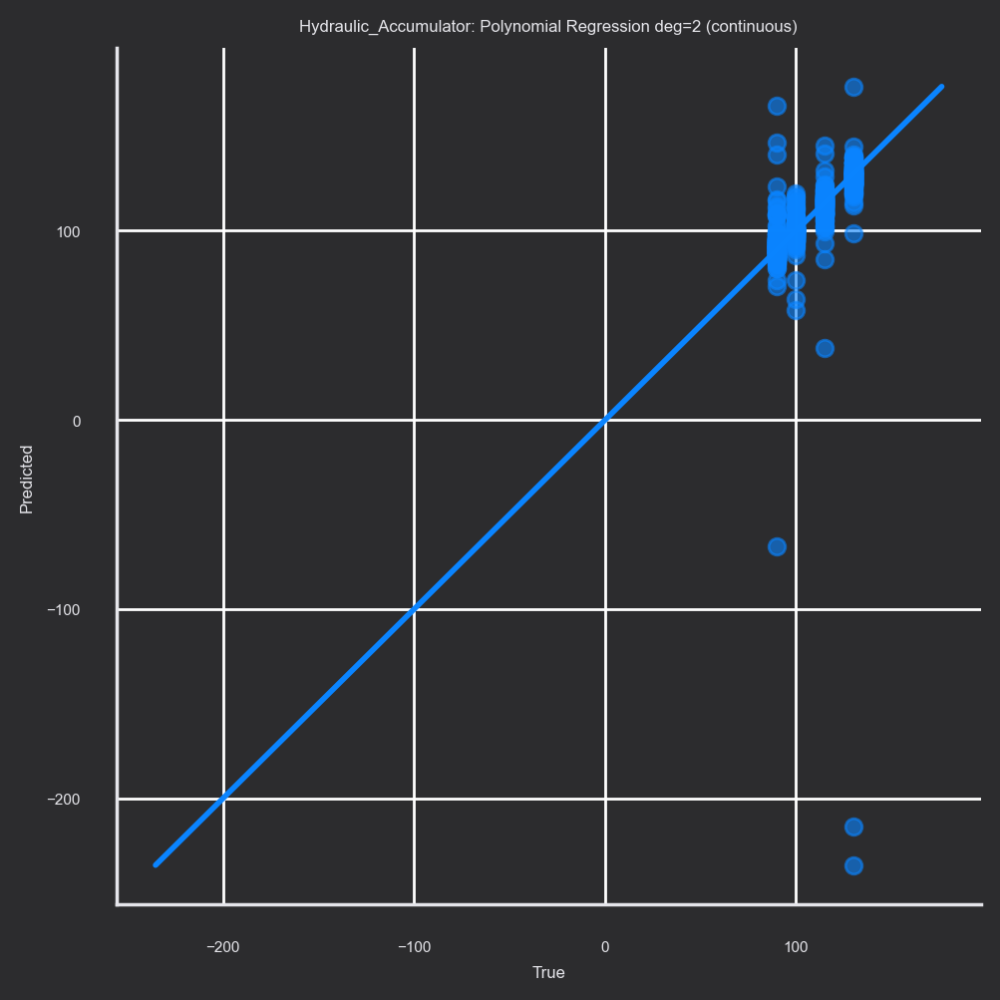

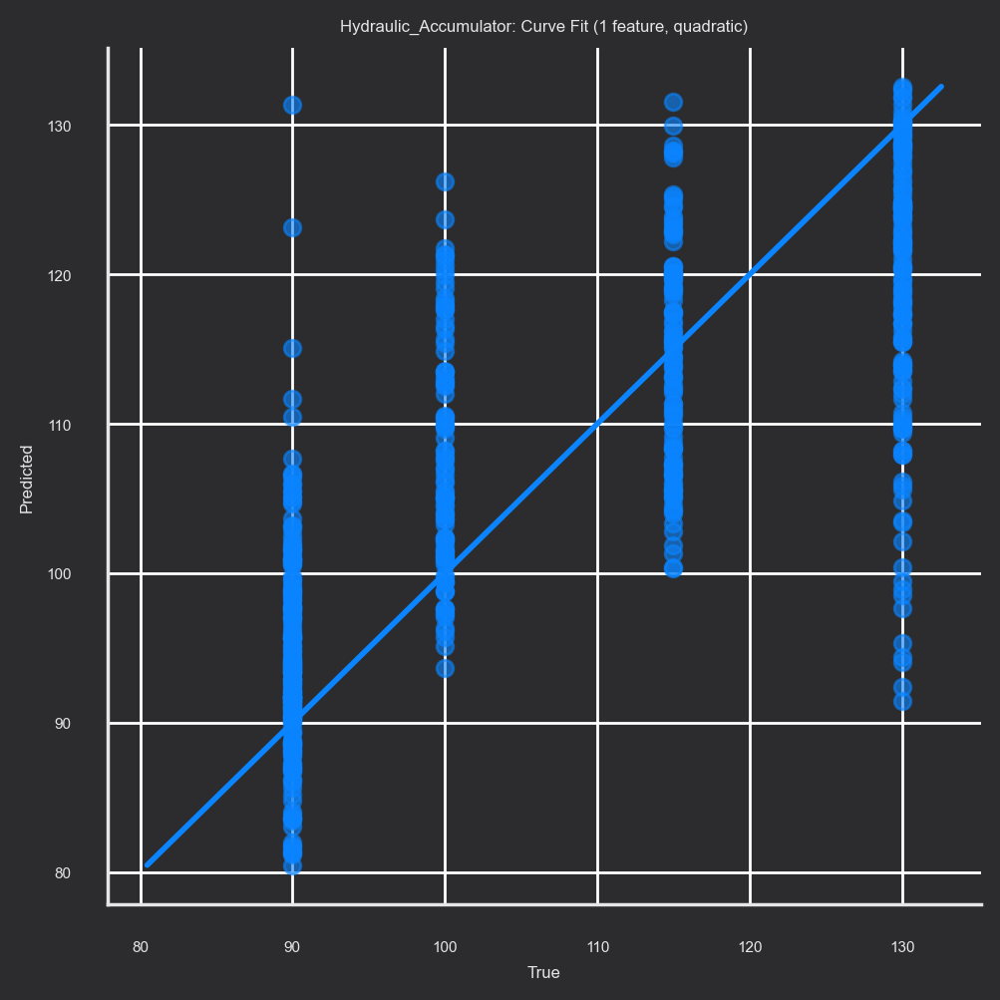

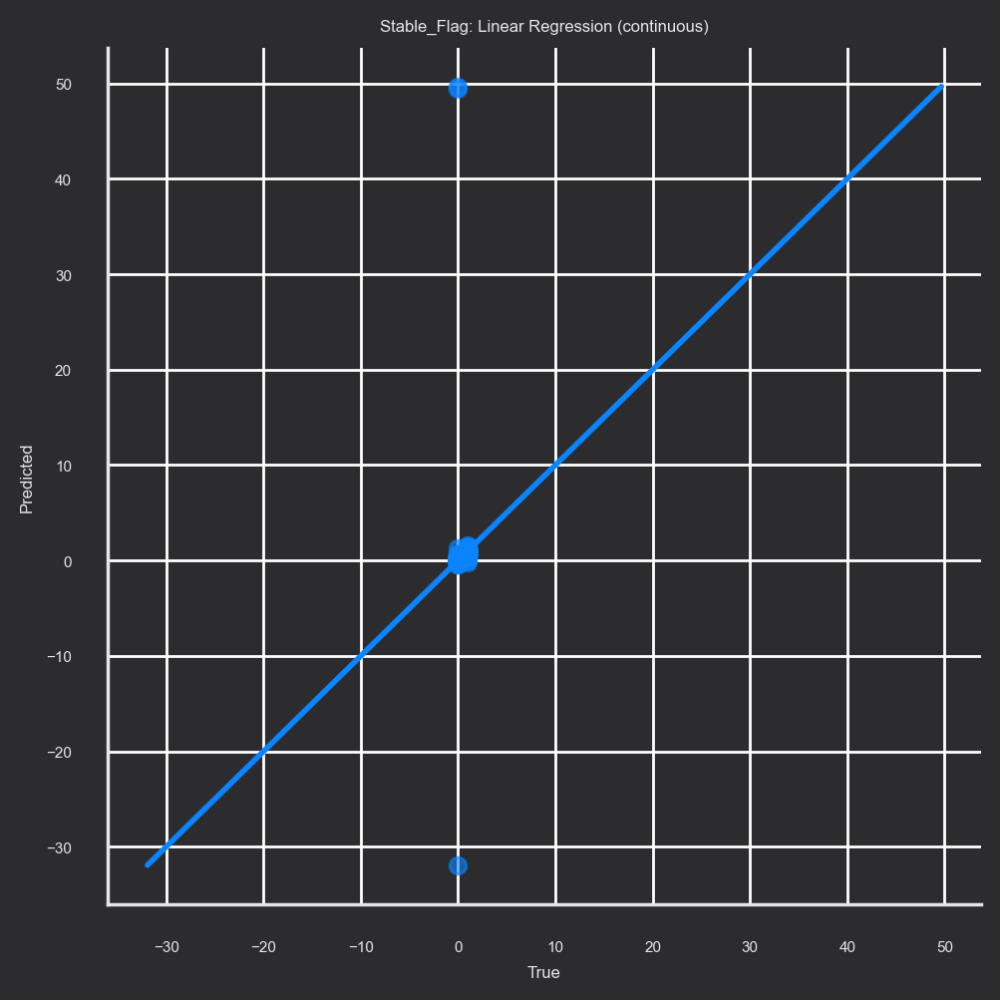

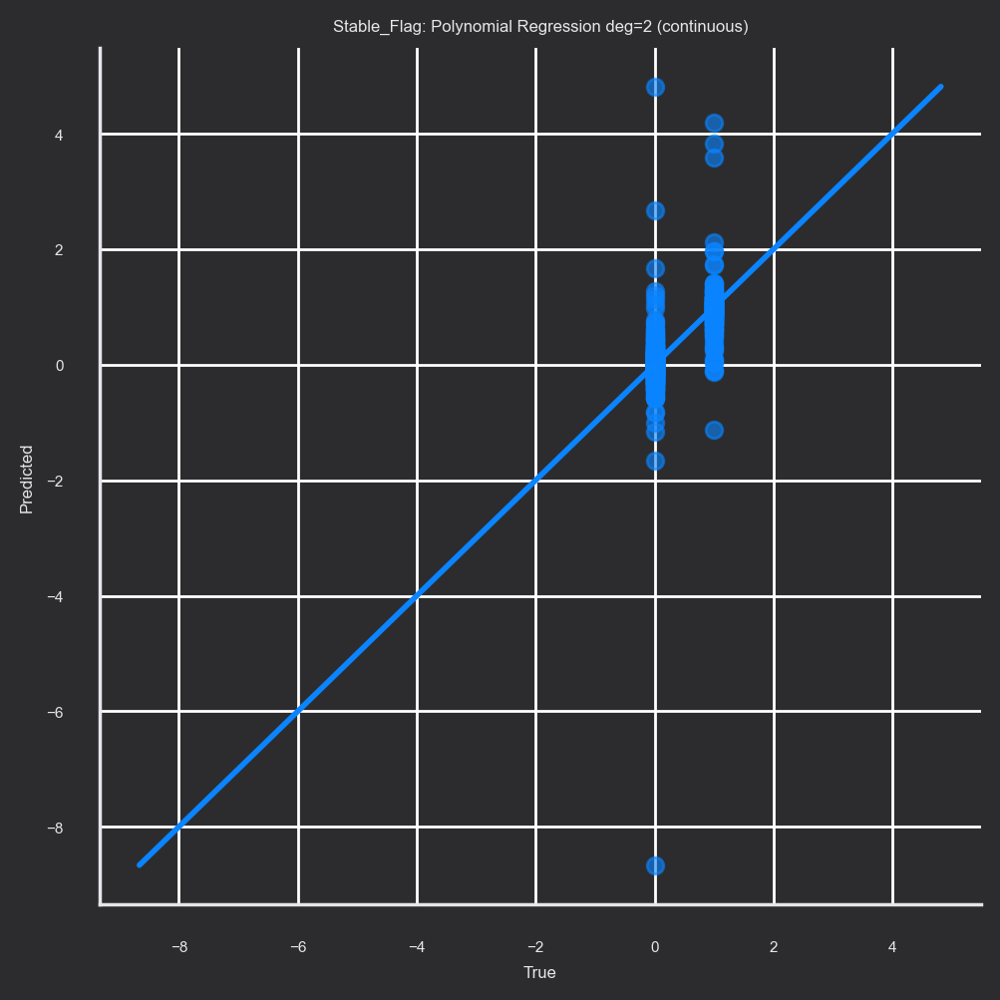

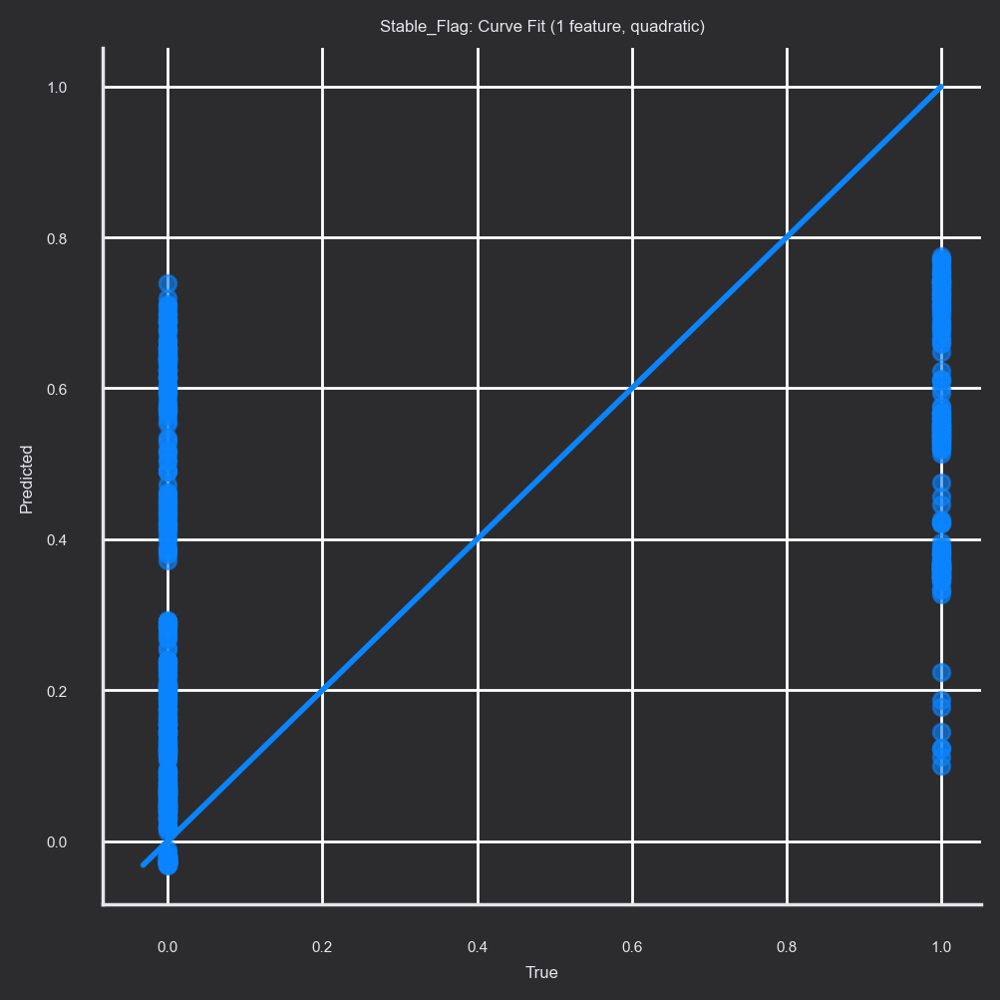


===== BASELINE RESULTS (sorted) =====


,target,MAE,RMSE,R2,mode
2,Cooler_Condition | CurveFit(1feat),1.302844,1.765519,0.998295,continuous
0,Cooler_Condition | Linear,1.139899,3.268708,0.994157,continuous
1,Cooler_Condition | Poly(deg=2),2.217748,7.084255,0.972556,continuous
20,Hydraulic_Accumulator | CurveFit(1feat),8.008725,10.730779,0.563133,continuous
18,Hydraulic_Accumulator | Linear,3.277210,17.175324,-0.119172,continuous
19,Hydraulic_Accumulator | Poly(deg=2),6.537185,24.203716,-1.222548,continuous
14,Internal_Pump_Leakage | CurveFit(1feat),0.308805,0.414074,0.755567,continuous
12,Internal_Pump_Leakage | Linear,0.134106,1.214744,-1.103642,continuous
13,Internal_Pump_Leakage | Poly(deg=2),0.191757,0.763328,0.169336,continuous
26,Stable_Flag | CurveFit(1feat),0.328142,0.406194,0.259531,continuous


In [35]:
# 1) Setup: features + targets
label_cols = ['Cooler_Condition','Valve_Condition','Internal_Pump_Leakage','Hydraulic_Accumulator','Stable_Flag']

X = df_final.drop(columns=label_cols)
# Ensure purely numeric feature matrix
X = X.select_dtypes(include=[np.number]).replace([np.inf, -np.inf], np.nan).fillna(0.0)

targets = {
    "Cooler_Condition": df_final["Cooler_Condition"].astype(float),
    "Valve_Condition": df_final["Valve_Condition"].astype(float),
    "Internal_Pump_Leakage": df_final["Internal_Pump_Leakage"].astype(float),
    "Hydraulic_Accumulator": df_final["Hydraulic_Accumulator"].astype(float),
    "Stable_Flag": df_final["Stable_Flag"].astype(float),  # treated as continuous baseline
}

# train/test split indexes (so every target uses same split)
idx = np.arange(len(df_final))
idx_train, idx_test = train_test_split(idx, test_size=0.25, random_state=42, shuffle=True)

X_train, X_test = X.iloc[idx_train], X.iloc[idx_test]


# 2) Metrics + plotting helpers
def regression_report(y_true, y_pred, name=""):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    return {"target": name, "MAE": mae, "RMSE": rmse, "R2": r2}

def plot_pred_vs_true(y_true, y_pred, title):
    plt.figure(figsize=(5, 5))
    plt.scatter(y_true, y_pred, alpha=0.6)
    mn = min(np.min(y_true), np.min(y_pred))
    mx = max(np.max(y_true), np.max(y_pred))
    plt.plot([mn, mx], [mn, mx], linewidth=2)  # y=x reference
    plt.xlabel("True")
    plt.ylabel("Predicted")
    plt.title(title)
    plt.tight_layout()
    plt.show()

def clip_to_label_set(y_pred, label_values):
    """
    For discrete grade targets, map continuous predictions
    to nearest allowed label value for a fairer 'grade' comparison.
    """
    label_values = np.array(sorted(list(set(label_values))), dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    idx = np.argmin(np.abs(y_pred.reshape(-1, 1) - label_values.reshape(1, -1)), axis=1)
    return label_values[idx]


# 3) Baseline Models
def train_linear_regression(X_train, y_train):
    # Standardize features for numerical stability
    model = Pipeline([
        ("scaler", StandardScaler(with_mean=True, with_std=True)),
        ("lr", LinearRegression())
    ])
    model.fit(X_train, y_train)
    return model

def train_polynomial_regression(X_train, y_train, degree=2, alpha=1.0):
    """
    PolynomialFeatures + Ridge (more stable than plain LR when features explode).
    """
    model = Pipeline([
        ("scaler", StandardScaler(with_mean=True, with_std=True)),
        ("poly", PolynomialFeatures(degree=degree, include_bias=False)),
        ("ridge", Ridge(alpha=alpha, random_state=42))
    ])
    model.fit(X_train, y_train)
    return model


# 4) Curve Fitting Baseline (single feature)
# Pick ONE feature with highest absolute correlation to the target on TRAIN set
def pick_best_single_feature(X_train, y_train):
    df_tmp = X_train.copy()
    df_tmp["__y__"] = y_train.values
    corr = df_tmp.corr(numeric_only=True)["__y__"].drop("__y__", errors="ignore")
    best_feat = corr.abs().sort_values(ascending=False).index[0]
    return best_feat, corr[best_feat]

# simple curve families
def curve_linear(x, a, b):
    return a*x + b

def curve_quadratic(x, a, b, c):
    return a*x**2 + b*x + c

def curve_exp(x, a, b, c):
    # a*exp(bx)+c
    return a*np.exp(b*x) + c

def curve_log(x, a, b, c):
    # a*log(bx)+c  (requires x>0)
    return a*np.log(b*x) + c

def fit_curve_1feature(x_train, y_train, curve_type="quadratic"):
    """
    Fit y = f(x) using scipy.curve_fit on ONE feature.
    Returns (params, func).
    """
    if not SCIPY_CURVE_OK:
        raise ImportError("scipy.optimize.curve_fit not available in your environment.")

    x_train = np.asarray(x_train, dtype=float)
    y_train = np.asarray(y_train, dtype=float)

    if curve_type == "linear":
        func = curve_linear
        p0 = (1.0, 0.0)
    elif curve_type == "quadratic":
        func = curve_quadratic
        p0 = (1.0, 1.0, 0.0)
    elif curve_type == "exp":
        func = curve_exp
        p0 = (1.0, 0.01, 0.0)
    elif curve_type == "log":
        func = curve_log
        # ensure x>0 for log fit
        x_train = np.clip(x_train, 1e-6, None)
        p0 = (1.0, 1.0, 0.0)
    else:
        raise ValueError("curve_type must be one of: linear, quadratic, exp, log")

    params, _ = curve_fit(func, x_train, y_train, p0=p0, maxfev=10000)
    return params, func

def predict_curve_1feature(x, params, func, curve_type="quadratic"):
    x = np.asarray(x, dtype=float)
    if curve_type == "log":
        x = np.clip(x, 1e-6, None)
    return func(x, *params)


# 5) Run baselines for each target + compare to true scores
results = []
all_models = {}

for target_name, y in targets.items():
    y_train = y.iloc[idx_train]
    y_test  = y.iloc[idx_test]

    # --- A) Linear regression baseline
    lin = train_linear_regression(X_train, y_train)
    yhat_lin = lin.predict(X_test)

    # If target is discrete grades, also compute "nearest-grade" version
    yhat_lin_grade = clip_to_label_set(yhat_lin, y_train.values)

    # --- B) Polynomial regression baseline (degree 2)
    poly2 = train_polynomial_regression(X_train, y_train, degree=2, alpha=5.0)
    yhat_poly2 = poly2.predict(X_test)
    yhat_poly2_grade = clip_to_label_set(yhat_poly2, y_train.values)

    # --- C) Curve fitting baseline (single feature)
    curve_info = None
    if SCIPY_CURVE_OK:
        best_feat, best_corr = pick_best_single_feature(X_train, y_train)
        xtr = X_train[best_feat].values
        xte = X_test[best_feat].values

        # choose curve family; quadratic usually a safe starter
        curve_type = "quadratic"
        try:
            params, func = fit_curve_1feature(xtr, y_train.values, curve_type=curve_type)
            yhat_curve = predict_curve_1feature(xte, params, func, curve_type=curve_type)
            yhat_curve_grade = clip_to_label_set(yhat_curve, y_train.values)
            curve_info = (best_feat, best_corr, curve_type, params)
        except Exception as e:
            yhat_curve = None
            yhat_curve_grade = None
            curve_info = ("FAILED", str(e))
    else:
        yhat_curve = None
        yhat_curve_grade = None
        curve_info = ("SKIPPED", "scipy not available")

    # --- Store models
    all_models[target_name] = {
        "linear": lin,
        "poly2": poly2,
        "curve": curve_info,
    }

    # --- Compare continuous predictions (regression metrics)
    results.append({**regression_report(y_test.values, yhat_lin,   name=f"{target_name} | Linear"), "mode": "continuous"})
    results.append({**regression_report(y_test.values, yhat_poly2, name=f"{target_name} | Poly(deg=2)"), "mode": "continuous"})
    if yhat_curve is not None:
        results.append({**regression_report(y_test.values, yhat_curve, name=f"{target_name} | CurveFit(1feat)"), "mode": "continuous"})

    # --- Compare after snapping to valid grade set (still using MAE/RMSE)
    results.append({**regression_report(y_test.values, yhat_lin_grade,   name=f"{target_name} | Linear (nearest grade)"), "mode": "nearest-grade"})
    results.append({**regression_report(y_test.values, yhat_poly2_grade, name=f"{target_name} | Poly2 (nearest grade)"), "mode": "nearest-grade"})
    if yhat_curve_grade is not None:
        results.append({**regression_report(y_test.values, yhat_curve_grade, name=f"{target_name} | CurveFit (nearest grade)"), "mode": "nearest-grade"})

    # --- Quick plots
    plot_pred_vs_true(y_test.values, yhat_lin,   f"{target_name}: Linear Regression (continuous)")
    plot_pred_vs_true(y_test.values, yhat_poly2, f"{target_name}: Polynomial Regression deg=2 (continuous)")

    if yhat_curve is not None:
        plot_pred_vs_true(y_test.values, yhat_curve, f"{target_name}: Curve Fit (1 feature, {curve_info[2]})")

# 6) Summary table
results_df = pd.DataFrame(results).sort_values(["mode", "target"])
print("\n===== BASELINE RESULTS (sorted) =====")
display(results_df)

# ML Models
## - Random Forest (regression)
## - XGBoost (regression)
## - LSTM (time-series / sequence model)
## Evaluate: RMSE + MAE

In [36]:
# 1) Helpers
def rmse(y_true, y_pred):
    return float(np.sqrt(mean_squared_error(y_true, y_pred)))

def mae(y_true, y_pred):
    return float(mean_absolute_error(y_true, y_pred))

def eval_regression(name, y_true, y_pred):
    return {
        "model": name,
        "RMSE": rmse(y_true, y_pred),
        "MAE": mae(y_true, y_pred),
    }

def safe_numeric_df(df):
    X = df.select_dtypes(include=[np.number]).copy()
    X = X.replace([np.inf, -np.inf], np.nan).fillna(0.0)
    return X

#2) Feature-based models (RF, XGB)
label_cols = ['Cooler_Condition','Valve_Condition','Internal_Pump_Leakage','Hydraulic_Accumulator','Stable_Flag']

# Features (engineered)
X = safe_numeric_df(df_final.drop(columns=label_cols, errors="ignore"))

# Pick ONE target for now; you can loop targets later
TARGET = "Stable_Flag"  # change to any label col
y = df_final[TARGET].astype(float).values

X_train, X_test, y_train, y_test = train_test_split(
    X.values, y, test_size=0.25, random_state=42, shuffle=True
)

results = []

# ---- Random Forest Regressor
rf = RandomForestRegressor(
    n_estimators=500,
    random_state=42,
    n_jobs=-1,
    max_depth=None,
    min_samples_leaf=2
)
rf.fit(X_train, y_train)
pred_rf = rf.predict(X_test)
results.append(eval_regression("RandomForestRegressor", y_test, pred_rf))

# ---- XGBoost Regressor
xgb = XGBRegressor(
    n_estimators=1200,
    learning_rate=0.03,
    max_depth=6,
    subsample=0.9,
    colsample_bytree=0.9,
    reg_lambda=1.0,
    objective="reg:squarederror",
    random_state=42,
    n_jobs=-1
)
xgb.fit(X_train, y_train)
pred_xgb = xgb.predict(X_test)
results.append(eval_regression("XGBRegressor", y_test, pred_xgb))

results_df = pd.DataFrame(results).sort_values("RMSE")
print(f"\n=== Feature-based models for target: {TARGET} ===")
display(results_df)

# 3) LSTM (sequence model) using RAW time-series per cycle
#    (not engineered features)

# Build input tensor X_seq with shape:
#   (n_cycles, timesteps, n_channels)

# Strategy:
# - resample each sensor cycle to a common length (e.g., 60 timesteps)
# - stack sensors as channels
# - train LSTM to predict chosen target y

# NOTE: LSTM works best for continuous targets; for discrete grades you can still regress.

def resample_1d(x, target_len=60):
    """Linear resample a 1D array to target_len."""
    x = np.asarray(x, dtype=float)
    n = x.size
    if n == target_len:
        return x
    old_idx = np.linspace(0, 1, n)
    new_idx = np.linspace(0, 1, target_len)
    return np.interp(new_idx, old_idx, x)

def build_sequence_tensor(sensor_registry, target_len=60, normalize_per_channel=True):
    """
    sensor_registry: list of (name, arr_2d) where arr_2d is (n_cycles, n_samples)
    returns X_seq: (n_cycles, target_len, n_channels)
    """
    n_cycles = sensor_registry[0][1].shape[0]
    X_channels = []

    for name, arr2d in sensor_registry:
        arr2d = np.asarray(arr2d)
        # resample each cycle
        ch = np.vstack([resample_1d(arr2d[i], target_len) for i in range(n_cycles)])  # (n_cycles, target_len)
        X_channels.append(ch)

    # stack channels -> (n_cycles, target_len, n_channels)
    X_seq = np.stack(X_channels, axis=-1)

    if normalize_per_channel:
        # z-score per channel using training statistics later (handled separately)
        pass

    return X_seq

# Choose which raw sensors to include as channels (start smaller, then expand)
# You can include all, but start with a subset to debug quickly.
raw_sensor_registry = [
    ("PS1", ps1),
    ("PS2", ps2),
    ("PS3", ps3),
    ("PS4", ps4),
    ("PS5", ps5),
    ("PS6", ps6),
    ("EPS1", eps1),
    ("FS1", fs1),
    ("FS2", fs2),
    ("TS1", ts1),
    ("TS2", ts2),
    ("TS3", ts3),
    ("TS4", ts4),
    ("VS1", vs1),
    ("CE", ce),
    ("CP", cp),
    ("SE", se),
]

TIMESTEPS = 60  # common length for all sensors per cycle
X_seq = build_sequence_tensor(raw_sensor_registry, target_len=TIMESTEPS)

# Align y with cycles
y_seq = df_final[TARGET].astype(float).values
assert X_seq.shape[0] == y_seq.shape[0], "Mismatch: cycles in X_seq vs y_seq"

# Train/test split (same random seed)
idx = np.arange(len(y_seq))
idx_train, idx_test = train_test_split(idx, test_size=0.25, random_state=42, shuffle=True)

X_train_seq, X_test_seq = X_seq[idx_train], X_seq[idx_test]
y_train_seq, y_test_seq = y_seq[idx_train], y_seq[idx_test]

# Normalize per channel using TRAIN stats only
ch_mean = X_train_seq.mean(axis=(0, 1), keepdims=True)
ch_std  = X_train_seq.std(axis=(0, 1), keepdims=True) + 1e-8

X_train_seq = (X_train_seq - ch_mean) / ch_std
X_test_seq  = (X_test_seq  - ch_mean) / ch_std

# Build LSTM model
n_channels = X_train_seq.shape[-1]

tf.random.set_seed(42)
model = Sequential([
    LSTM(64, return_sequences=True, input_shape=(TIMESTEPS, n_channels)),
    Dropout(0.2),
    LSTM(32, return_sequences=False),
    Dropout(0.2),
    Dense(32, activation="relu"),
    Dense(1)  # regression output
])

model.compile(optimizer="adam", loss="mse", metrics=[tf.keras.metrics.MeanAbsoluteError()])

es = EarlyStopping(monitor="val_loss", patience=8, restore_best_weights=True)

history = model.fit(
    X_train_seq, y_train_seq,
    validation_split=0.2,
    epochs=60,
    batch_size=64,
    callbacks=[es],
    verbose=1
)

pred_lstm = model.predict(X_test_seq).reshape(-1)
lstm_metrics = eval_regression("LSTM (raw sequences)", y_test_seq, pred_lstm)

print(f"\n=== LSTM results for target: {TARGET} ===")
print(lstm_metrics)

# 4) Compare all (RF, XGB, LSTM)
all_results = pd.DataFrame(results + [lstm_metrics]).sort_values("RMSE")
display(all_results)

# 5) (Optional) Run ALL targets automatically
def run_all_targets(df_final, X_features, sensor_registry_2d, timesteps=60):
    """
    For each target in label_cols:
      - RF regression on engineered features
      - XGB regression on engineered features
      - LSTM regression on raw sequences
    Returns a DataFrame of RMSE/MAE for all.
    """
    X_feat = safe_numeric_df(X_features)

    # Pre-build sequences once
    X_seq = build_sequence_tensor(sensor_registry_2d, target_len=timesteps)

    out = []
    idx = np.arange(len(df_final))
    idx_train, idx_test = train_test_split(idx, test_size=0.25, random_state=42, shuffle=True)

    # Split sequences
    X_train_seq, X_test_seq = X_seq[idx_train], X_seq[idx_test]
    ch_mean = X_train_seq.mean(axis=(0, 1), keepdims=True)
    ch_std  = X_train_seq.std(axis=(0, 1), keepdims=True) + 1e-8
    X_train_seq_n = (X_train_seq - ch_mean) / ch_std
    X_test_seq_n  = (X_test_seq  - ch_mean) / ch_std

    # Split feature matrix
    X_train_f, X_test_f = X_feat.iloc[idx_train].values, X_feat.iloc[idx_test].values

    for t in label_cols:
        y = df_final[t].astype(float).values
        y_train, y_test = y[idx_train], y[idx_test]

        # RF
        rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1, min_samples_leaf=2)
        rf.fit(X_train_f, y_train)
        out.append({"target": t, **eval_regression("RF", y_test, rf.predict(X_test_f))})

        # XGB
        xgb = XGBRegressor(
            n_estimators=1200, learning_rate=0.03, max_depth=6,
            subsample=0.9, colsample_bytree=0.9, reg_lambda=1.0,
            objective="reg:squarederror", random_state=42, n_jobs=-1
        )
        xgb.fit(X_train_f, y_train)
        out.append({"target": t, **eval_regression("XGB", y_test, xgb.predict(X_test_f))})

        # LSTM (new model per target)
        tf.random.set_seed(42)
        model = Sequential([
            LSTM(64, return_sequences=True, input_shape=(timesteps, X_train_seq_n.shape[-1])),
            Dropout(0.2),
            LSTM(32),
            Dropout(0.2),
            Dense(32, activation="relu"),
            Dense(1)
        ])
        model.compile(optimizer="adam", loss="mse", metrics=[tf.keras.metrics.MeanAbsoluteError()])
        es = EarlyStopping(monitor="val_loss", patience=6, restore_best_weights=True)

        model.fit(
            X_train_seq_n, y_train,
            validation_split=0.2,
            epochs=40,
            batch_size=64,
            callbacks=[es],
            verbose=0
        )
        pred = model.predict(X_test_seq_n).reshape(-1)
        out.append({"target": t, **eval_regression("LSTM", y_test, pred)})

    return pd.DataFrame(out).sort_values(["target", "RMSE"])

# To run all targets:
# X_features should be your engineered feature matrix (before labels)
# Example:
# all_targets_results = run_all_targets(df_final, X_features, raw_sensor_registry, timesteps=60)
# display(all_targets_results)


=== Feature-based models for target: Stable_Flag ===


,model,RMSE,MAE
1,XGBRegressor,0.127681,0.039897
0,RandomForestRegressor,0.146339,0.052013


Epoch 1/60
21/21 ━━━━━━━━━━━━━━━━━━━━ 9s 127ms/step - loss: 0.2059 - mean_absolute_error: 0.3900 - val_loss: 0.1311 - val_mean_absolute_error: 0.2933
Epoch 2/60
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 92ms/step - loss: 0.1425 - mean_absolute_error: 0.2993 - val_loss: 0.0841 - val_mean_absolute_error: 0.2057
Epoch 3/60
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - loss: 0.1017 - mean_absolute_error: 0.2208 - val_loss: 0.0849 - val_mean_absolute_error: 0.1689
Epoch 4/60
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0880 - mean_absolute_error: 0.1935 - val_loss: 0.0656 - val_mean_absolute_error: 0.1421
Epoch 5/60
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0804 - mean_absolute_error: 0.1792 - val_loss: 0.0610 - val_mean_absolute_error: 0.1379
Epoch 6/60
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 84ms/step - loss: 0.0781 - mean_absolute_error: 0.1704 - val_loss: 0.0593 - val_mean_absolute_error: 0.1293
Epoch 7/60
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - loss: 0.0727 - mean_absolute_error: 0.1646 - val_los

,model,RMSE,MAE
1,XGBRegressor,0.127681,0.039897
0,RandomForestRegressor,0.146339,0.052013
2,LSTM (raw sequences),0.243263,0.135109


# Unsupervised Clustering + t-SNE/UMAP + "hidden states"
## - K-Means
## - DBSCAN
## - UMAP / t-SNE visualization
## - Heuristics to label clusters as: good batch / drift / early failure

Clustering matrix shape: (2205, 30)
Best K by silhouette: 2 (score=0.523)


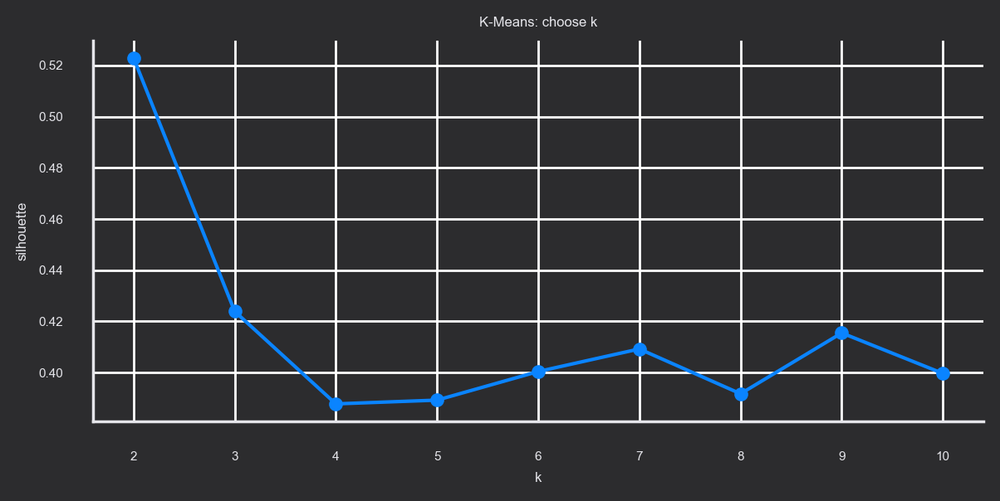

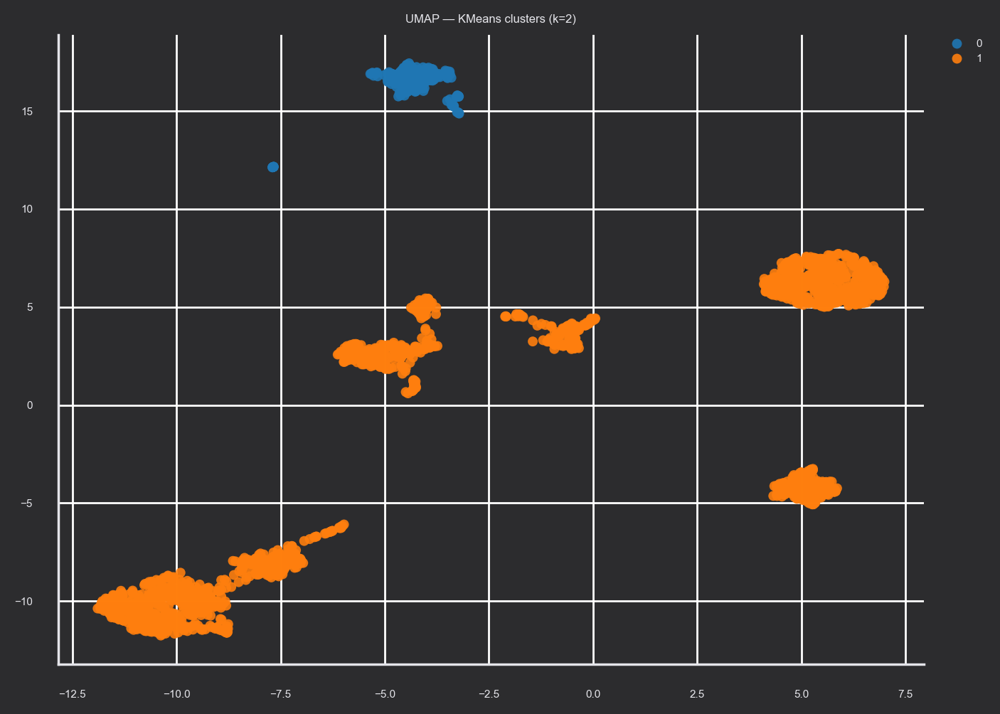

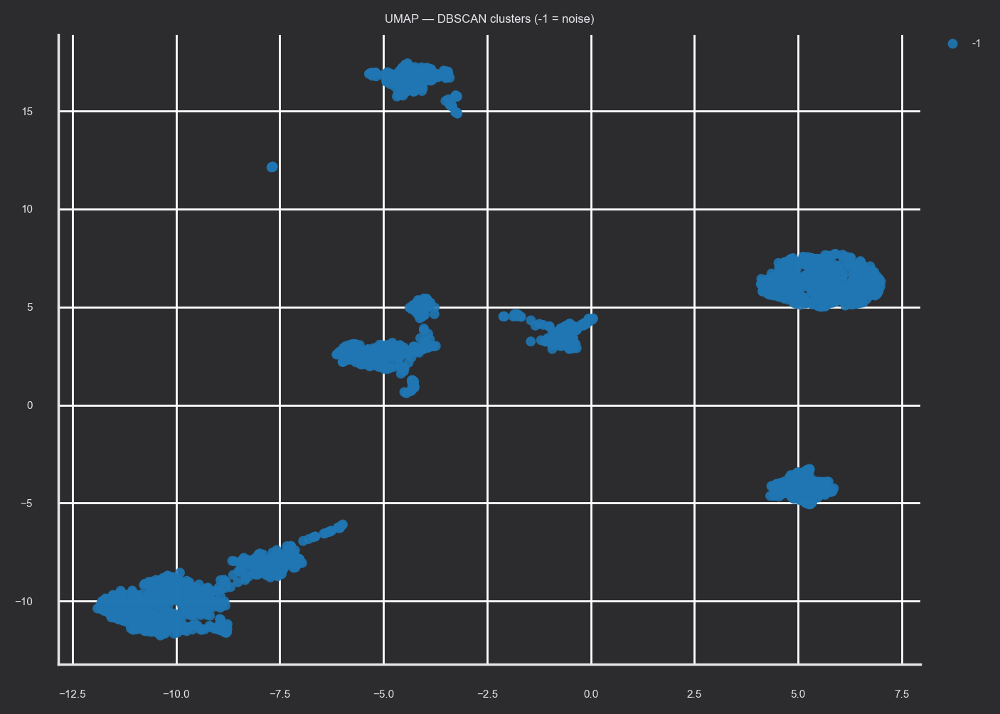


KMeans cluster stats:


,n,avg_within_std
cluster,,
1,1959,1.061807e+08
0,246,4.530191e+08



DBSCAN cluster stats (note: -1 = noise):


,n,avg_within_std
cluster,,
-1,2205,7.251023e+08


Heuristic good KMeans cluster: 1

Distance-from-good (KMeans):


,cluster,dist_from_good
1,1,0.0000
0,0,35.5524


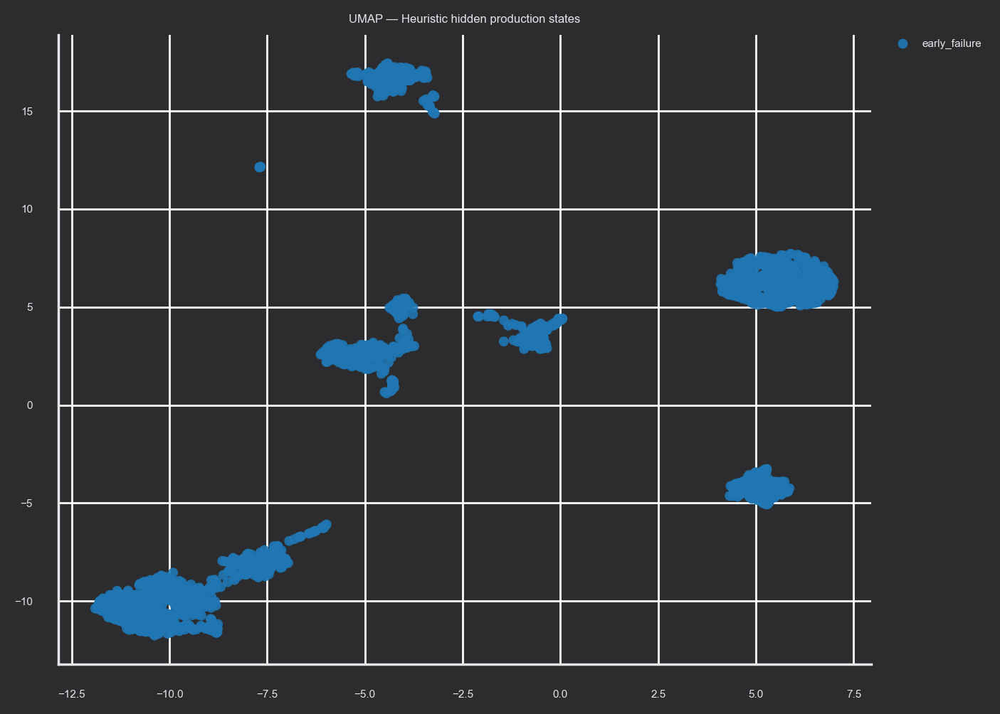


Hidden state vs labels (quick sanity checks):


Stable_Flag,0.0,1.0
hidden_state,,
early_failure,0.657143,0.342857


,Cooler_Condition,Valve_Condition,Internal_Pump_Leakage,Hydraulic_Accumulator,Stable_Flag
hidden_state,,,,,
early_failure,41.240816,90.693878,0.669388,107.199546,0.342857


In [37]:
# 1) Prepare feature matrix for clustering
def prep_X_for_unsup(X_features: pd.DataFrame, pca_dim=30):
    X = X_features.select_dtypes(include=[np.number]).copy()
    X = X.replace([np.inf, -np.inf], np.nan).fillna(0.0)

    scaler = StandardScaler()
    Xs = scaler.fit_transform(X.values)

    # PCA helps both clustering + embeddings (less noise, faster)
    if pca_dim is not None and pca_dim < Xs.shape[1]:
        pca = PCA(n_components=pca_dim, random_state=42)
        Xp = pca.fit_transform(Xs)
    else:
        pca = None
        Xp = Xs

    return X, scaler, pca, Xp

X_raw, scaler, pca, Xp = prep_X_for_unsup(X_features, pca_dim=30)
print("Clustering matrix shape:", Xp.shape)

# 2) K-Means: choose K using silhouette
def pick_k_by_silhouette(Xp, k_list=range(2, 11)):
    best_k, best_s = None, -1
    scores = []
    for k in k_list:
        km = KMeans(n_clusters=k, random_state=42, n_init=20)
        labels = km.fit_predict(Xp)
        s = silhouette_score(Xp, labels)
        scores.append((k, s))
        if s > best_s:
            best_k, best_s = k, s
    return best_k, best_s, pd.DataFrame(scores, columns=["k", "silhouette"])

best_k, best_s, sil_df = pick_k_by_silhouette(Xp, k_list=range(2, 11))
print(f"Best K by silhouette: {best_k} (score={best_s:.3f})")

plt.figure(figsize=(6, 3))
plt.plot(sil_df["k"], sil_df["silhouette"], marker="o")
plt.xlabel("k")
plt.ylabel("silhouette")
plt.title("K-Means: choose k")
plt.tight_layout()
plt.show()

kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=20)
km_labels = kmeans.fit_predict(Xp)

# 3) DBSCAN: density-based clustering (finds outliers/noise)
# Tip: eps is data-dependent; start with 0.8~2.5 after StandardScaler+PCA.
dbscan = DBSCAN(eps=1.3, min_samples=10)
db_labels = dbscan.fit_predict(Xp)  # -1 means noise/outliers

# 4) Embeddings: UMAP or t-SNE for visualization
def make_umap(Xp, n_neighbors=30, min_dist=0.15):
    um = UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=2,
        random_state=42
    )
    return um.fit_transform(Xp)

def make_tsne(Xp, perplexity=30):
    ts = TSNE(
        n_components=2,
        perplexity=perplexity,
        learning_rate="auto",
        init="pca",
        random_state=42
    )
    return ts.fit_transform(Xp)

emb_umap = make_umap(Xp)
# emb_tsne = make_tsne(Xp)  # slower; uncomment if you want t-SNE too

# 5) Plot helper
def plot_embedding(emb2d, labels, title):
    plt.figure(figsize=(7, 5))
    sns.scatterplot(x=emb2d[:, 0], y=emb2d[:, 1], hue=labels, palette="tab10",
                    s=25, linewidth=0, alpha=0.9)
    plt.title(title)
    plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
    plt.tight_layout()
    plt.show()

plot_embedding(emb_umap, km_labels, f"UMAP — KMeans clusters (k={best_k})")
plot_embedding(emb_umap, db_labels, "UMAP — DBSCAN clusters (-1 = noise)")

# 6) "Hidden production states" heuristic labeling
#    We don't magically know "good/drift/early failure" without a definition.
#    So we define them using unsupervised signals:
#      - "good batch": dense, stable cluster; low within-cluster variability
#      - "drift": cluster centroid far from "good" centroid, but still dense
#      - "early failure": outliers/noise (DBSCAN -1) OR small sparse clusters

def cluster_summary(X_df, cluster_labels):
    tmp = X_df.copy()
    tmp["cluster"] = cluster_labels
    # size + mean + std across features (aggregate stability proxy)
    size = tmp.groupby("cluster").size().rename("n")
    # average feature std inside cluster (lower => more stable)
    stab = tmp.groupby("cluster").std(numeric_only=True).mean(axis=1).rename("avg_within_std")
    # cluster centroid in feature space
    centroid = tmp.groupby("cluster").mean(numeric_only=True)
    out = pd.concat([size, stab], axis=1).sort_values("n", ascending=False)
    return out, centroid

km_stats, km_centroids = cluster_summary(X_raw, km_labels)
print("\nKMeans cluster stats:")
display(km_stats)

db_stats, db_centroids = cluster_summary(X_raw, db_labels)
print("\nDBSCAN cluster stats (note: -1 = noise):")
display(db_stats)

# Pick "good cluster" as: largest + most stable (lowest avg_within_std among top clusters)
def pick_good_cluster(stats_df, top_n=3):
    top = stats_df.head(top_n).copy()
    return int(top["avg_within_std"].idxmin())

good_km = pick_good_cluster(km_stats, top_n=min(3, len(km_stats)))
print("Heuristic good KMeans cluster:", good_km)

# Drift score = distance of cluster centroid from "good" centroid (in PCA space)
# (Use Xp space for distances to avoid huge feature scaling effects)
def centroid_distance_in_Xp(Xp, labels):
    # centroid in Xp
    cent = {}
    for c in np.unique(labels):
        cent[c] = Xp[labels == c].mean(axis=0)
    return cent

km_cent_Xp = centroid_distance_in_Xp(Xp, km_labels)
good_cent = km_cent_Xp[good_km]

drift_dist = {c: float(np.linalg.norm(km_cent_Xp[c] - good_cent)) for c in km_cent_Xp.keys()}
drift_df = pd.DataFrame({"cluster": list(drift_dist.keys()), "dist_from_good": list(drift_dist.values())})
drift_df = drift_df.sort_values("dist_from_good", ascending=True)
print("\nDistance-from-good (KMeans):")
display(drift_df)

# Assign state labels:
# - good batch: chosen good_km
# - early failure: DBSCAN noise points OR very small KMeans clusters
# - drift: everything else (with large distance)
def assign_hidden_state(km_labels, db_labels, good_cluster, small_cluster_thresh=0.03):
    n = len(km_labels)
    km_counts = pd.Series(km_labels).value_counts(normalize=True)

    state = np.array(["drift"] * n, dtype=object)
    state[km_labels == good_cluster] = "good_batch"

    # small KMeans clusters -> early_failure
    small_clusters = km_counts[km_counts < small_cluster_thresh].index.tolist()
    state[np.isin(km_labels, small_clusters)] = "early_failure"

    # DBSCAN noise -> early_failure (strongest signal)
    state[db_labels == -1] = "early_failure"
    return state

hidden_state = assign_hidden_state(km_labels, db_labels, good_km, small_cluster_thresh=0.03)

plot_embedding(emb_umap, hidden_state, "UMAP — Heuristic hidden production states")

# 7) (Optional) Validate against labels if you have df_target
#    This does NOT train; it just checks if clusters correlate with failures.
if "df_target" in globals():
    tmp = df_target.copy().reset_index(drop=True)
    tmp["km_cluster"] = km_labels
    tmp["db_cluster"] = db_labels
    tmp["hidden_state"] = hidden_state

    print("\nHidden state vs labels (quick sanity checks):")
    # Example: Stable_Flag distribution per state
    if "Stable_Flag" in tmp.columns:
        display(pd.crosstab(tmp["hidden_state"], tmp["Stable_Flag"], normalize="index"))

    # Example: mean of conditions per hidden state
    numeric_cols = [c for c in tmp.columns if c not in ["km_cluster","db_cluster","hidden_state"]]
    display(tmp.groupby("hidden_state")[numeric_cols].mean(numeric_only=True))

# DOMAIN ADAPTATION DEMO (Cat1 -> Cat2)
## - Classification demo on Stable_Flag
## - Zero-shot vs fine-tune vs freeze vs feature re-weighting

Product_Category
Cat1    1546
Cat2     659
Name: count, dtype: int64
Cat1 validation: {'method': 'Train Cat1 -> Val Cat1', 'AUC': 0.9829024569123578, 'ACC': 0.964516129032258, 'F1': 0.9478672985781991}


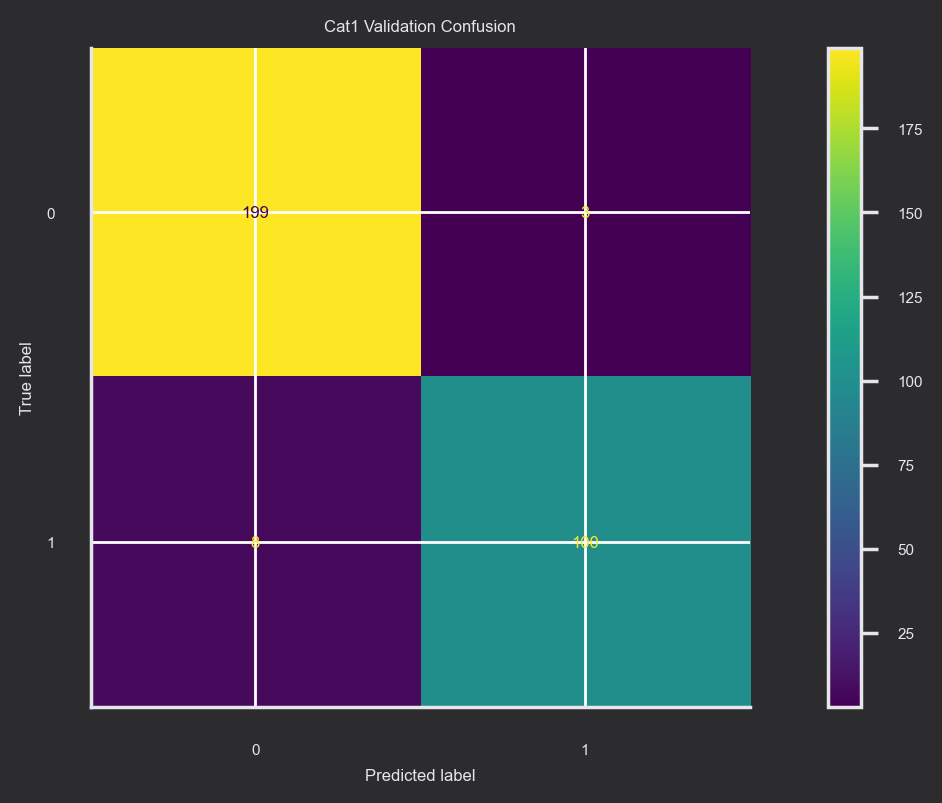

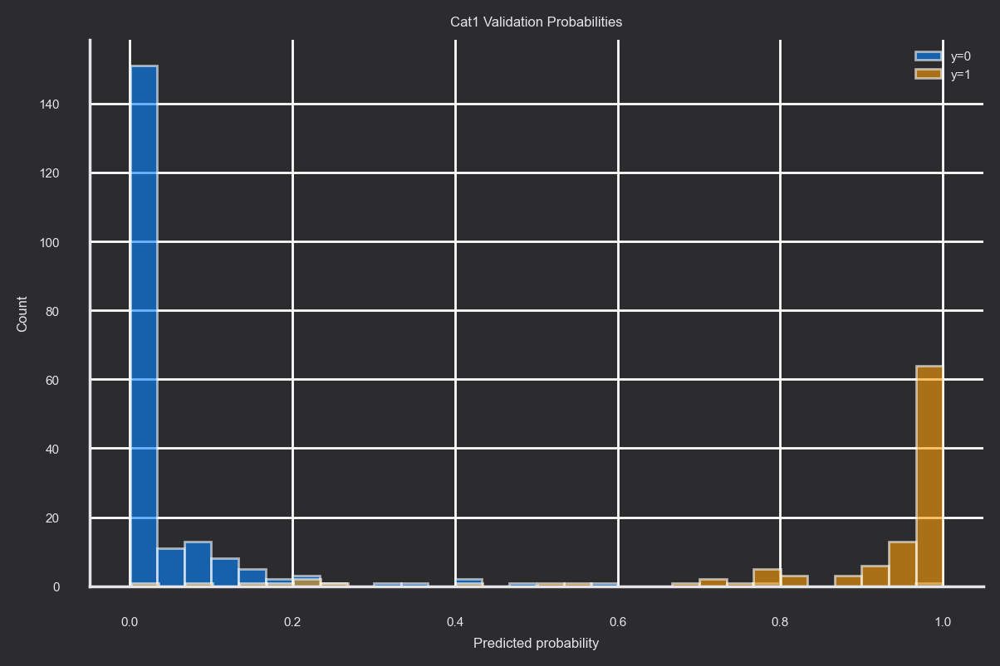

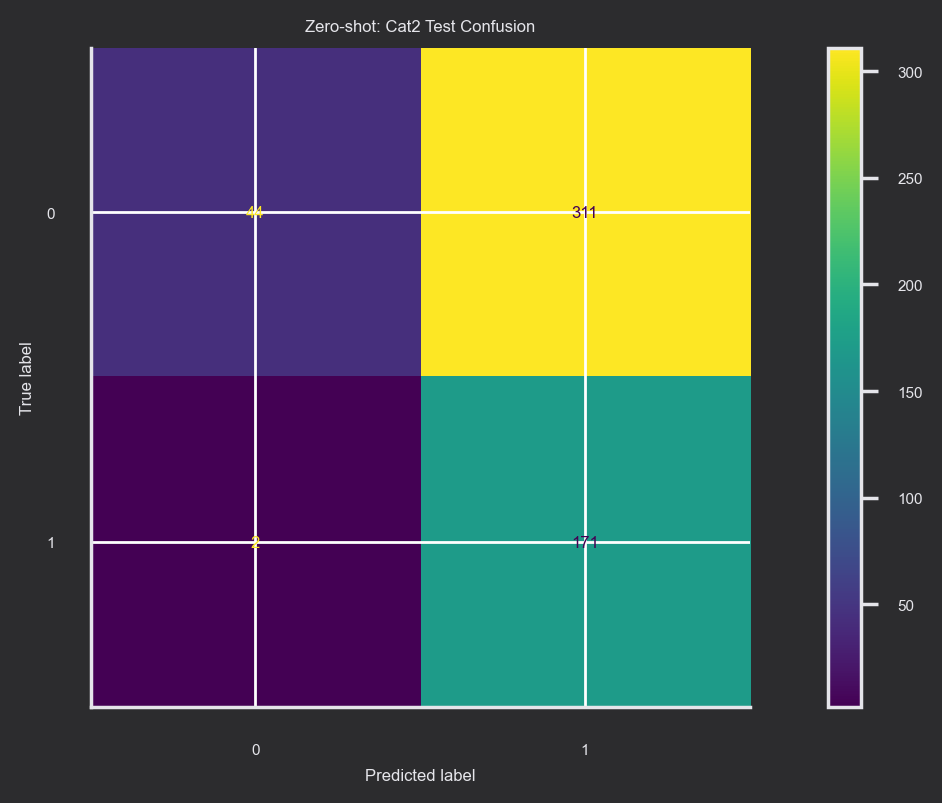

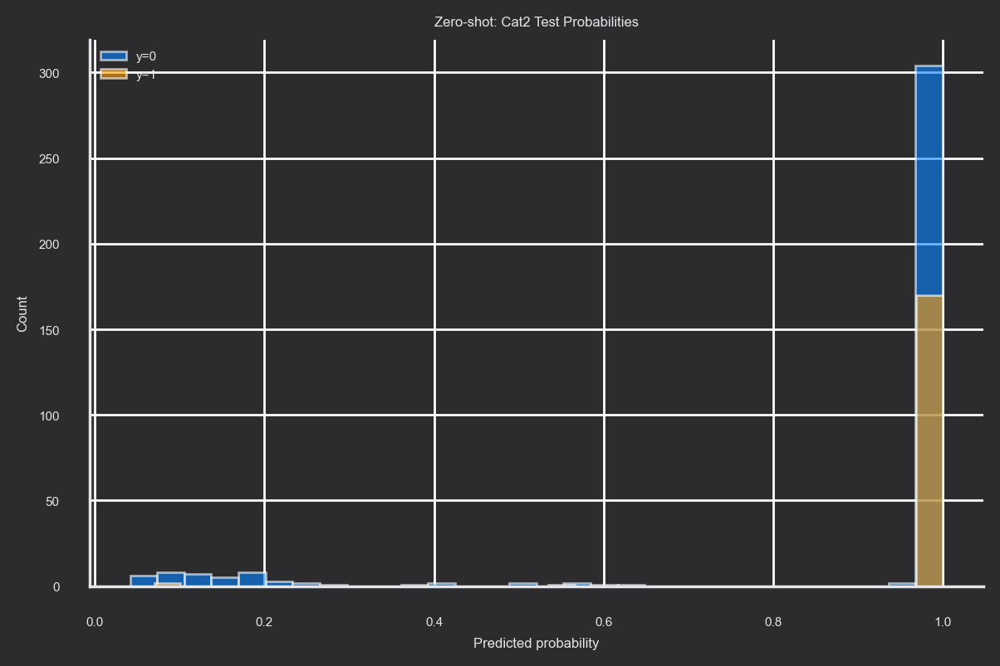

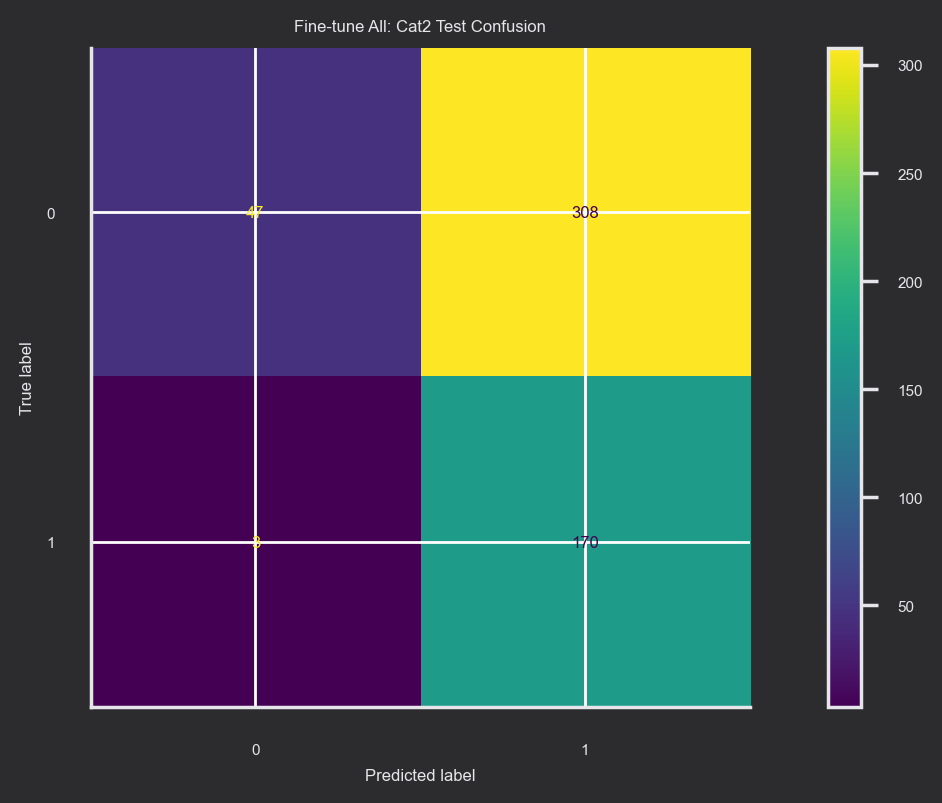

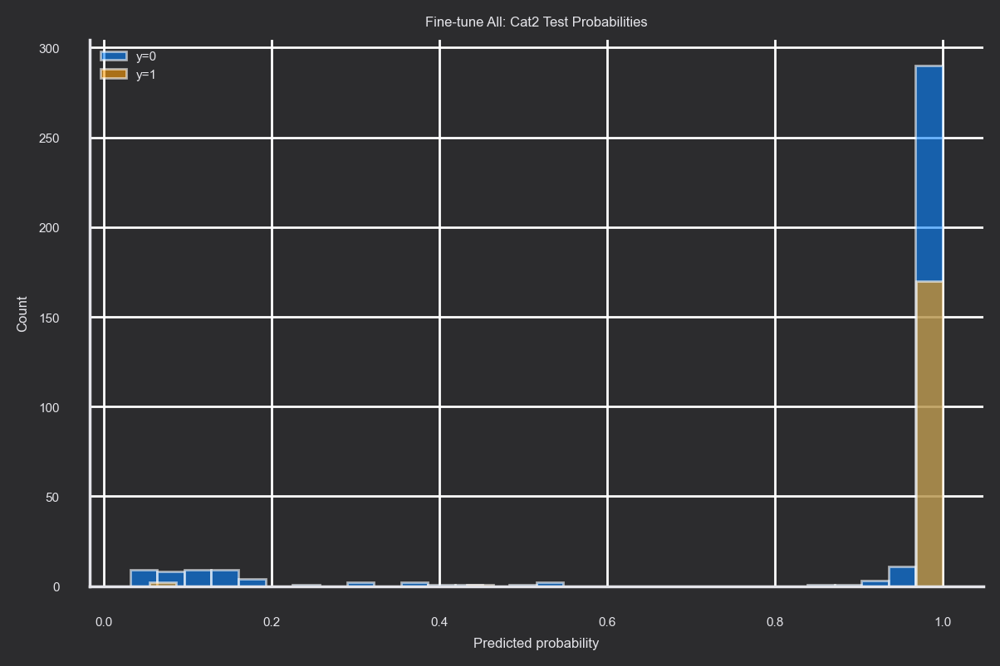

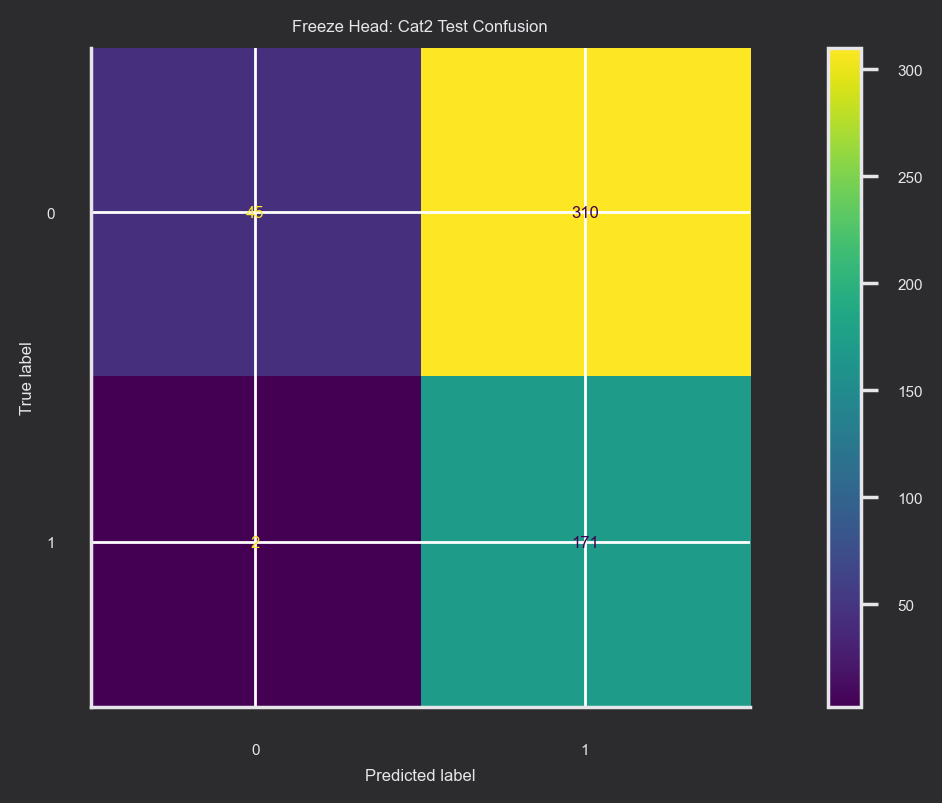

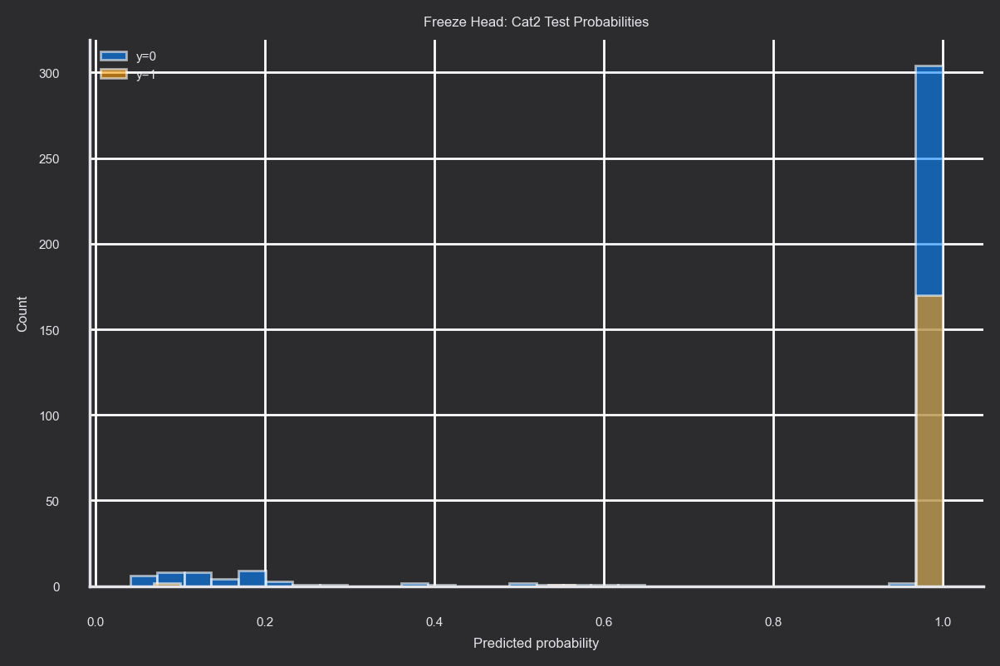

[INFO] Re-weighting: computing fast permutation importances on top 250 variance features...
  done 50/250
  done 100/250
  done 150/250
  done 200/250
  done 250/250


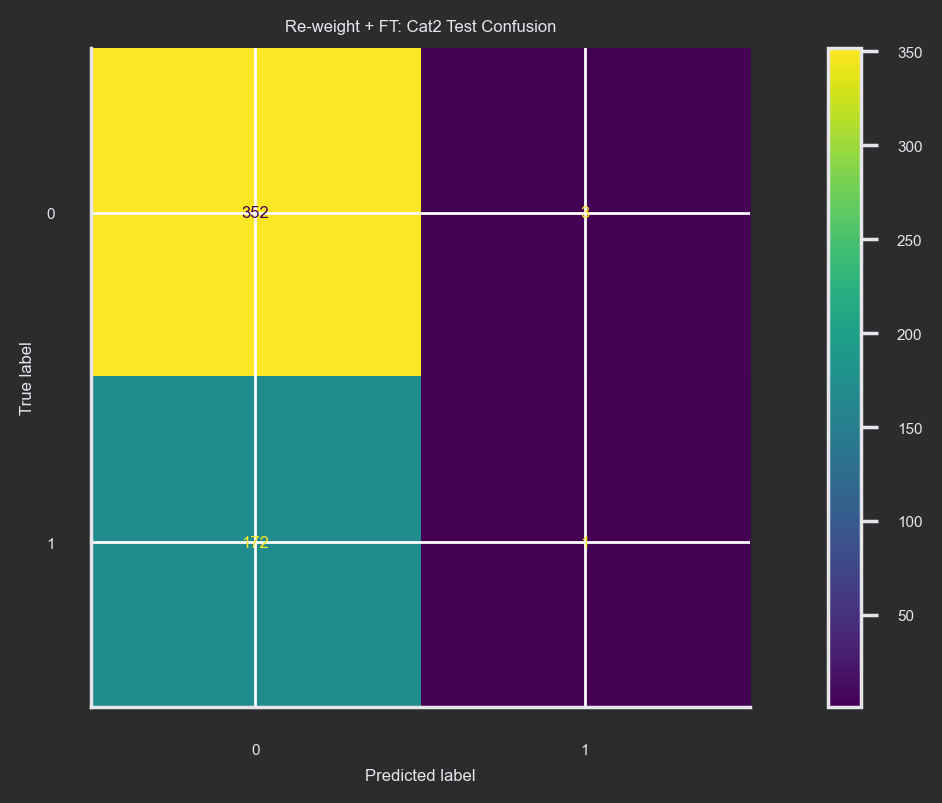

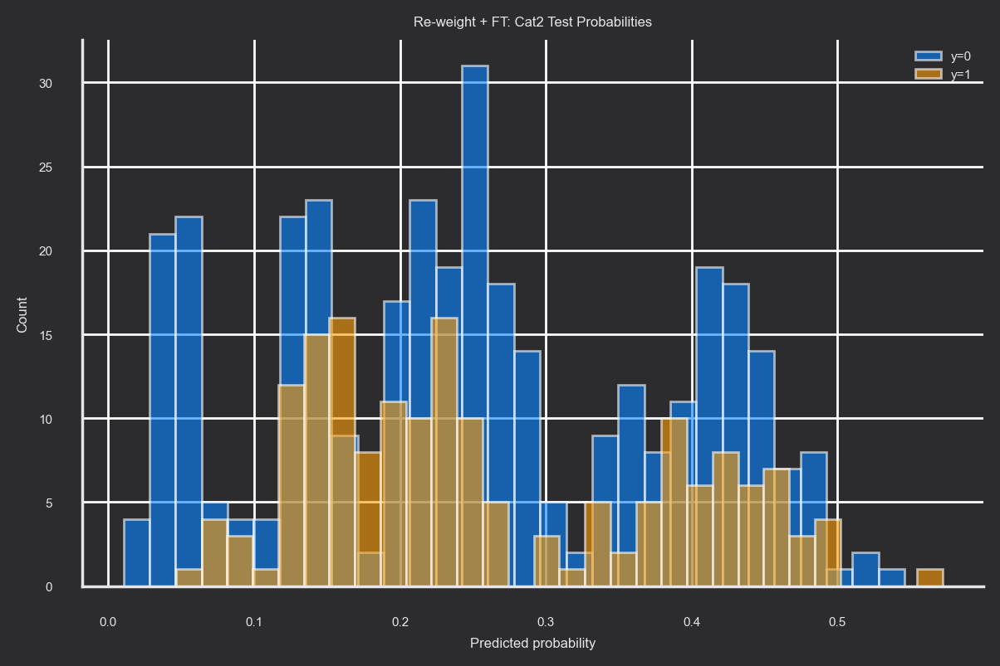


=== Domain Adaptation Results (Cat1 -> Cat2) ===
                                               method      AUC      ACC       F1
Freeze features + train head (Cat2 tune -> Cat2 test) 0.955027 0.409091 0.522936
                  Zero-shot (train Cat1 -> test Cat2) 0.954889 0.407197 0.522137
        Fine-tune all layers (Cat2 tune -> Cat2 test) 0.951828 0.410985 0.522273
                    Re-weight + fine-tune (Cat2 test) 0.513751 0.668561 0.011299


In [38]:
# CONFIG
CATEGORY_COL = "Product_Category"
CAT1 = "Cat1"
CAT2 = "Cat2"

TARGET_COL = "Stable_Flag"    # binary target
CAT2_TUNE_FRAC = 0.20         # fraction of Cat2 used for adaptation
TEST_SIZE_CAT1 = 0.20         # Cat1 validation split
EPOCHS_CAT1 = 25              # keep small for speed
EPOCHS_TUNE = 15              # keep small for speed

# You must already have these in df_final:
label_cols = ['Cooler_Condition','Valve_Condition','Internal_Pump_Leakage','Hydraulic_Accumulator','Stable_Flag']

# 1) Ensure category exists + create fake Cat1/Cat2 if needed
if CATEGORY_COL not in df_final.columns:
    df_final[CATEGORY_COL] = "C"

uniq_cats = df_final[CATEGORY_COL].astype(str).unique()
if len(uniq_cats) < 2:
    # Make up a fake domain shift: random 50/50 split
    rng = np.random.RandomState(RANDOM_STATE)
    mask = rng.rand(len(df_final)) < 0.5
    df_final[CATEGORY_COL] = np.where(mask, CAT1, CAT2)
    print(f"[INFO] Only one category existed ({uniq_cats}). Created fake {CAT1}/{CAT2} split 50/50.")

print(df_final[CATEGORY_COL].value_counts())

# 2) Build X/y/category safely
assert TARGET_COL in df_final.columns, f"Missing target '{TARGET_COL}' in df_final."

# Drop labels + keep numeric features only
X_all = df_final.drop(columns=list(set(label_cols + [CATEGORY_COL])), errors="ignore")
X_all = X_all.select_dtypes(include=[np.number]).replace([np.inf, -np.inf], np.nan).fillna(0.0)

y_all = df_final[TARGET_COL].astype(int).values
cat_all = df_final[CATEGORY_COL].astype(str).values

# Split indices by category
idx_cat1 = np.where(cat_all == CAT1)[0]
idx_cat2 = np.where(cat_all == CAT2)[0]

if len(idx_cat1) < 50 or len(idx_cat2) < 50:
    # If your dataset is small, relax the requirement.
    print("[WARN] One category is small. The demo will still run, but results may be noisy.")

# Cat1 train/val
idx1_train, idx1_val = train_test_split(
    idx_cat1, test_size=TEST_SIZE_CAT1, random_state=RANDOM_STATE, shuffle=True, stratify=y_all[idx_cat1]
)

# Cat2 tune/test
idx2_tune, idx2_test = train_test_split(
    idx_cat2, test_size=1.0 - CAT2_TUNE_FRAC, random_state=RANDOM_STATE, shuffle=True, stratify=y_all[idx_cat2]
)

X1_train, y1_train = X_all.iloc[idx1_train].values, y_all[idx1_train]
X1_val,   y1_val   = X_all.iloc[idx1_val].values,   y_all[idx1_val]

X2_tune, y2_tune = X_all.iloc[idx2_tune].values, y_all[idx2_tune]
X2_test, y2_test = X_all.iloc[idx2_test].values, y_all[idx2_test]

# Standardize using Cat1 stats only (classic domain-shift setup)
scaler = StandardScaler()
X1_train_s = scaler.fit_transform(X1_train)
X1_val_s   = scaler.transform(X1_val)
X2_tune_s  = scaler.transform(X2_tune)
X2_test_s  = scaler.transform(X2_test)

# 3) Metrics + plots (classification)
def eval_clf(y_true, p_prob, name):
    p_prob = np.asarray(p_prob).reshape(-1)
    p_pred = (p_prob >= 0.5).astype(int)
    auc = roc_auc_score(y_true, p_prob) if len(np.unique(y_true)) > 1 else np.nan
    acc = accuracy_score(y_true, p_pred)
    f1  = f1_score(y_true, p_pred, zero_division=0)
    return {"method": name, "AUC": float(auc) if auc == auc else None, "ACC": float(acc), "F1": float(f1)}

def plot_conf(y_true, p_prob, title):
    p_pred = (np.asarray(p_prob).reshape(-1) >= 0.5).astype(int)
    cm = confusion_matrix(y_true, p_pred, labels=[0,1])
    disp = ConfusionMatrixDisplay(cm, display_labels=[0,1])
    disp.plot(values_format="d")
    plt.title(title)
    plt.tight_layout()
    plt.show()

def plot_prob_hist(y_true, p_prob, title):
    p_prob = np.asarray(p_prob).reshape(-1)
    plt.figure(figsize=(6,4))
    plt.hist(p_prob[y_true==0], bins=30, alpha=0.6, label="y=0")
    plt.hist(p_prob[y_true==1], bins=30, alpha=0.6, label="y=1")
    plt.title(title)
    plt.xlabel("Predicted probability")
    plt.ylabel("Count")
    plt.legend()
    plt.tight_layout()
    plt.show()

# 4) Small MLP so freezing/fine-tuning makes sense (FAST)
def build_mlp(input_dim):
    inp = layers.Input(shape=(input_dim,), name="X")
    x = layers.Dense(64, activation="relu", name="feat_dense1")(inp)
    x = layers.Dropout(0.15)(x)
    x = layers.Dense(32, activation="relu", name="feat_dense2")(x)
    feat = layers.Dense(16, activation="relu", name="feat_dense3")(x)

    out = layers.Dense(1, activation="sigmoid", name="head")(feat)
    model = Model(inp, out, name="mlp_classifier")
    model.compile(
        optimizer=tf.keras.optimizers.Adam(1e-3),
        loss="binary_crossentropy",
        metrics=[tf.keras.metrics.AUC(name="auc"), tf.keras.metrics.BinaryAccuracy(name="acc")]
    )
    return model

input_dim = X1_train_s.shape[1]
es = tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)

# 5) Train on Cat1
base_model = build_mlp(input_dim)
base_model.fit(
    X1_train_s, y1_train,
    validation_data=(X1_val_s, y1_val),
    epochs=EPOCHS_CAT1,
    batch_size=128,
    callbacks=[es],
    verbose=0
)

p_cat1_val = base_model.predict(X1_val_s, verbose=0).reshape(-1)
print("Cat1 validation:", eval_clf(y1_val, p_cat1_val, "Train Cat1 -> Val Cat1"))
plot_conf(y1_val, p_cat1_val, "Cat1 Validation Confusion")
plot_prob_hist(y1_val, p_cat1_val, "Cat1 Validation Probabilities")

# 6) A) Zero-shot (Cat1 model -> Cat2 test)
res = []
p_zero = base_model.predict(X2_test_s, verbose=0).reshape(-1)
res.append(eval_clf(y2_test, p_zero, "Zero-shot (train Cat1 -> test Cat2)"))
plot_conf(y2_test, p_zero, "Zero-shot: Cat2 Test Confusion")
plot_prob_hist(y2_test, p_zero, "Zero-shot: Cat2 Test Probabilities")

# 7) B) Fine-tune all layers on Cat2_tune
ft_model = tf.keras.models.clone_model(base_model)
ft_model.set_weights(base_model.get_weights())
ft_model.compile(
    optimizer=tf.keras.optimizers.Adam(3e-4),
    loss="binary_crossentropy",
    metrics=[tf.keras.metrics.AUC(name="auc"), tf.keras.metrics.BinaryAccuracy(name="acc")]
)
ft_model.fit(
    X2_tune_s, y2_tune,
    validation_split=0.2,
    epochs=EPOCHS_TUNE,
    batch_size=128,
    callbacks=[es],
    verbose=0
)

p_ft = ft_model.predict(X2_test_s, verbose=0).reshape(-1)
res.append(eval_clf(y2_test, p_ft, "Fine-tune all layers (Cat2 tune -> Cat2 test)"))
plot_conf(y2_test, p_ft, "Fine-tune All: Cat2 Test Confusion")
plot_prob_hist(y2_test, p_ft, "Fine-tune All: Cat2 Test Probabilities")

# 8) C) Freeze features, train head only
freeze_model = tf.keras.models.clone_model(base_model)
freeze_model.set_weights(base_model.get_weights())

for layer in freeze_model.layers:
    if layer.name.startswith("feat_"):
        layer.trainable = False
    if layer.name == "head":
        layer.trainable = True

freeze_model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-3),
    loss="binary_crossentropy",
    metrics=[tf.keras.metrics.AUC(name="auc"), tf.keras.metrics.BinaryAccuracy(name="acc")]
)

freeze_model.fit(
    X2_tune_s, y2_tune,
    validation_split=0.2,
    epochs=EPOCHS_TUNE,
    batch_size=128,
    callbacks=[es],
    verbose=0
)

p_fr = freeze_model.predict(X2_test_s, verbose=0).reshape(-1)
res.append(eval_clf(y2_test, p_fr, "Freeze features + train head (Cat2 tune -> Cat2 test)"))
plot_conf(y2_test, p_fr, "Freeze Head: Cat2 Test Confusion")
plot_prob_hist(y2_test, p_fr, "Freeze Head: Cat2 Test Probabilities")

# 9) D) Feature re-weighting
#    - Compute importance by permuting ONE feature at a time
#    - Do it only for top-K high-variance features to keep runtime sane
def fast_perm_importance_auc(model, X, y, feature_idx, repeats=2, rng=None):
    """Returns drop in AUC when permuting feature_idx (positive = important)."""
    rng = np.random.RandomState(RANDOM_STATE) if rng is None else rng
    base = model.predict(X, verbose=0).reshape(-1)
    base_auc = roc_auc_score(y, base) if len(np.unique(y)) > 1 else 0.5

    drops = []
    Xp = X.copy()
    for _ in range(repeats):
        perm = rng.permutation(Xp.shape[0])
        Xp[:, feature_idx] = Xp[perm, feature_idx]
        p = model.predict(Xp, verbose=0).reshape(-1)
        auc = roc_auc_score(y, p) if len(np.unique(y)) > 1 else 0.5
        drops.append(base_auc - auc)
        Xp[:, feature_idx] = X[:, feature_idx]  # restore
    return float(np.mean(drops))

# pick top-K features by variance on Cat2_tune (cheap heuristic)
K = min(250, X2_tune_s.shape[1])
variances = X2_tune_s.var(axis=0)
top_idx = np.argsort(variances)[::-1][:K]

print(f"[INFO] Re-weighting: computing fast permutation importances on top {K} variance features...")

imp = np.zeros(X2_tune_s.shape[1], dtype=float)
rng = np.random.RandomState(RANDOM_STATE)
for j, fi in enumerate(top_idx):
    imp[fi] = max(0.0, fast_perm_importance_auc(base_model, X2_tune_s, y2_tune, fi, repeats=2, rng=rng))
    if (j+1) % 50 == 0:
        print(f"  done {j+1}/{K}")

# Convert importance -> weights in [1, 2]
if imp.max() > 0:
    w = 1.0 + imp / (imp.max() + 1e-12)
else:
    w = np.ones_like(imp)

X1_train_w = X1_train_s * w
X1_val_w   = X1_val_s   * w
X2_tune_w  = X2_tune_s  * w
X2_test_w  = X2_test_s  * w

rw_model = build_mlp(input_dim)
rw_model.fit(
    X1_train_w, y1_train,
    validation_data=(X1_val_w, y1_val),
    epochs=EPOCHS_CAT1,
    batch_size=128,
    callbacks=[es],
    verbose=0
)

rw_model.compile(
    optimizer=tf.keras.optimizers.Adam(3e-4),
    loss="binary_crossentropy",
    metrics=[tf.keras.metrics.AUC(name="auc"), tf.keras.metrics.BinaryAccuracy(name="acc")]
)

rw_model.fit(
    X2_tune_w, y2_tune,
    validation_split=0.2,
    epochs=EPOCHS_TUNE,
    batch_size=128,
    callbacks=[es],
    verbose=0
)

p_rw = rw_model.predict(X2_test_w, verbose=0).reshape(-1)
res.append(eval_clf(y2_test, p_rw, "Re-weight + fine-tune (Cat2 test)"))
plot_conf(y2_test, p_rw, "Re-weight + FT: Cat2 Test Confusion")
plot_prob_hist(y2_test, p_rw, "Re-weight + FT: Cat2 Test Probabilities")

# 10) Summary
res_df = pd.DataFrame(res).sort_values(["AUC","F1","ACC"], ascending=False)
print("\n=== Domain Adaptation Results (Cat1 -> Cat2) ===")
print(res_df.to_string(index=False))